# Previsão de Preços do Airbnb no Rio de Janeiro: Da Análise Exploratória ao Machine Learning

### Objetivo

Este projeto tem dois objetivos principais complementares:
- Para Anfitriões: Desenvolver um modelo de previsão de preços que permita a proprietários de imóveis determinar o valor ideal da diária, baseado nas características específicas de sua propriedade e localização.
- Para Hóspedes: Criar uma ferramenta que auxilie viajantes a identificar se um imóvel está com preço atrativo (abaixo da média para propriedades com características similares) ou se está sobrevalorizado.

### Obtenção dos Dados

As bases de dados foram retiradas do site kaggle: https://www.kaggle.com/allanbruno/airbnb-rio-de-janeiro

### Importar Bibliotecas e Bases de Dados

- Se o bloco abaixo der erro no seu computador, pesquise pelo programa "prompt Anaconda" e execute os seguintes códigos de instalação:
    - pip install seaborn
    - pip install plotly

In [10]:
import pandas as pd
import pathlib
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import time
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split

### Agora vamos importar as bases de dados

Para isso, vamos criar um dicionário com os 3 primeiros caracteres com os nomes dos meses e o número correspondente daquele mês.

Para cada arquivo da base de dados a gente vai importar o arquivo e criar uma coluna na base de dados com o mês e o ano de cada informação

In [11]:
meses = {'jan': 1, 'fev': 2, 'mar': 3, 'abr': 4, 'mai': 5, 'jun': 6, 'jul': 7, 'ago': 8, 'set': 9, 'out': 10, 'nov': 11, 'dez': 12}

caminho_bases = pathlib.Path('dataset') # salva o caminho de onde estão as bates

base_airbnb = pd.DataFrame() # cria um df vazio

for arquivo in caminho_bases.iterdir(): # percorre por todos os arquivos
    nome_mes = arquivo.name[:3] # pega os 3 primeiros caracteries do nome do arquivo (mes)
    mes = meses[nome_mes] # correlaciona o mes com o numero do mes a partir do dicionario
    ano = arquivo.name[-8:] # pega os 8 ultimos caracteries, contando com a extensão do arquivo
    ano = int(ano.replace('.csv', '')) # remove o .csv do ano
    df = pd.read_csv(caminho_bases / arquivo.name) # le o arquivo csv
    df['ano'] = ano # adc um coluna com as informções
    df['mes'] = mes # adc um  coluna com as informções
    base_airbnb = pd.concat([base_airbnb, df], ignore_index=True)


C:\Users\fabio\AppData\Local\Temp\ipykernel_17940\902535874.py:12: DtypeWarning: Columns (62,87) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name) # le o arquivo csv
C:\Users\fabio\AppData\Local\Temp\ipykernel_17940\902535874.py:12: DtypeWarning: Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name) # le o arquivo csv
C:\Users\fabio\AppData\Local\Temp\ipykernel_17940\902535874.py:12: DtypeWarning: Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name) # le o arquivo csv
C:\Users\fabio\AppData\Local\Temp\ipykernel_17940\902535874.py:12: DtypeWarning: Columns (87) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name) # le o arquivo csv
C:\Users\fabio\AppData\Local\Temp\ipykern

In [12]:
display(base_airbnb)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews_ltm,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,38844730,https://www.airbnb.com/rooms/38844730,20190923212307,2019-09-24,TRANSAMERICA BARRA DA TIJUCA R IV,"Em estilo contemporâneo, o Transamerica Prime ...",NaN,"Em estilo contemporâneo, o Transamerica Prime ...",none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,15.0,0.0,0.0
902206,38846408,https://www.airbnb.com/rooms/38846408,20190923212307,2019-09-24,Alugo para o Rock in Rio,"Confortável apartamento, 2 quartos , sendo 1 s...",O apartamento estará com mobília completa disp...,"Confortável apartamento, 2 quartos , sendo 1 s...",none,"Muito próximo ao Parque Olímpico, local do eve...",...,2.0,2.0,1125.0,1125.0,2.0,1125.0,0.0,1.0,0.0,0.0
902207,38846703,https://www.airbnb.com/rooms/38846703,20190923212307,2019-09-24,Apt COMPLETO em COPACABANA c/TOTAL SEGURANÇA,Apartamento quarto e sala COMPLETO para curtas...,Espaço ideal para até 5 pessoas. Cama de casal...,Apartamento quarto e sala COMPLETO para curtas...,none,NaN,...,3.0,3.0,1125.0,1125.0,3.0,1125.0,0.0,23.0,6.0,0.0
902208,38847050,https://www.airbnb.com/rooms/38847050,20190923212307,2019-09-24,Cobertura Cinematografica,Cobertura alto nivel,NaN,Cobertura alto nivel,none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,1.0,0.0,0.0


### Agora vamos começar os tratamentos

- Como temos muitas colunas, nosso modelo pode acabar ficando muito lento.
- Além disso, uma análise rápida permite ver que várias colunas não são necessárias para o nosso modelo de previsão, por isso, vamos excluir algumas colunas da nossa base
- Tipos de colunas que vamos excluir:
    1. IDs, Links e informações não relevantes para o modelo
    2. Colunas repetidas ou extremamente parecidas com outra (que dão a mesma informação para o modelo. Ex: Data x Ano/Mês
    3. Colunas preenchidas com texto livre -> Não rodaremos nenhuma análise de palavras ou algo do tipo
    4. Colunas em que todos ou quase todos os valores são iguais
    
- Para isso, vamos criar um arquivo em excel com os 1.000 primeiros registros e fazer uma análise qualitativa, olhando as colunas e identificando quais são desnecessárias

In [13]:
# vamos criar um arquivo em excel com as primeiras 1000 linhas, para podermos abrir e ver quais coluans podemos excluir
base_airbnb.head(1000).to_csv('primeiros_regstros.csv', sep=';')

### Depois da análise qualitativa das colunas, levando em conta os critérios explicados acima, ficamos com as seguintes colunas:


In [14]:
print(base_airbnb[['experiences_offered']].value_counts())

experiences_offered
none                   902210
Name: count, dtype: int64


In [15]:
print((base_airbnb['host_is_superhost']==base_airbnb['host_listings_count']).value_counts())

False    902210
Name: count, dtype: int64


In [16]:
print(base_airbnb['square_feet'].isnull().sum())

888162


## DEPOIS DA ANALISE QUALITATIVA DAS COLUNAS, LEVANDO EM CONTA OS CRITEIROS ACIMA, FICAMOS COM AS SEGUINTES COLUNAS

In [17]:
colunas = ['host_response_time','host_response_rate','host_is_superhost','host_listings_count','neighbourhood','latitude','longitude','property_type','room_type','accommodates','bathrooms','bedrooms','beds','bed_type','amenities','price','security_deposit','cleaning_fee','guests_included','extra_people','minimum_nights','maximum_nights','number_of_reviews','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','instant_bookable','is_business_travel_ready','cancellation_policy','ano','mes']
base_airbnb = base_airbnb.loc[:, colunas] #filtro da base, com todas as linhas e apenas as colunas selecionadas
display(base_airbnb)

,host_response_time,host_response_rate,host_is_superhost,host_listings_count,neighbourhood,latitude,longitude,property_type,room_type,accommodates,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,ano,mes
0,NaN,NaN,f,1.0,Botafogo,-22.946854,-43.182737,Apartment,Entire home/apt,4,...,9.0,9.0,9.0,9.0,9.0,f,f,strict_14_with_grace_period,2018,4
1,within an hour,100%,t,2.0,Copacabana,-22.965919,-43.178962,Condominium,Entire home/apt,5,...,9.0,10.0,10.0,9.0,9.0,t,f,strict,2018,4
2,within an hour,100%,f,1.0,Ipanema,-22.985698,-43.201935,Apartment,Entire home/apt,2,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
3,within an hour,100%,f,3.0,Copacabana,-22.977117,-43.190454,Apartment,Entire home/apt,3,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
4,within an hour,100%,t,1.0,Ipanema,-22.983024,-43.214270,Apartment,Entire home/apt,3,...,10.0,10.0,10.0,10.0,9.0,t,f,strict,2018,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,within an hour,93%,f,0.0,Barra da Tijuca,-23.003180,-43.342840,Apartment,Entire home/apt,4,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
902206,NaN,NaN,f,0.0,Barra da Tijuca,-22.966640,-43.393450,Apartment,Entire home/apt,4,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
902207,within a few hours,74%,f,32.0,Copacabana,-22.962080,-43.175520,Apartment,Entire home/apt,5,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9
902208,NaN,NaN,f,0.0,Barra da Tijuca,-23.003400,-43.341820,Apartment,Entire home/apt,4,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9


### Tratar Valores Faltando

Diante disso, avaliei três possíveis abordagens para lidar com esses valores ausentes:
1. Usar apenas dados completos: excluir todas as linhas com qualquer valor faltante, o que reduziria drasticamente o tamanho do dataset (em mais de 50%), comprometendo a representatividade dos dados.
2. Remoção seletiva (abordagem adotada): excluir colunas com muitos valores ausentes e remover linhas apenas nas colunas com poucos dados faltantes (menos de 0,35% do total). Essa opção preserva a maior parte dos dados úteis, mantém a qualidade do modelo e evita introduzir viés.
3. Imputação de valores: preencher os dados ausentes com valores estimados (média, mediana ou modelos preditivos), o que pode causar viés significativo e comprometer a integridade da análise.

Por isso, escolhi a abordagem 2, que equilibra a preservação dos dados com a qualidade da modelagem, garantindo um conjunto consistente e representativo para a análise preditiva. Após o tratamento, as colunas reduziram para essa quantidade de valores ausentes:

In [18]:
print(base_airbnb.isnull().sum())

# Quantidade de linhas e colunas do banco de dados
print('Entradas: {} \t'.format(base_airbnb.shape[0]))
print('Colunas/Variáveis: {} \t'.format(base_airbnb.shape[1]))


host_response_time             401843
host_response_rate             401846
host_is_superhost                 460
host_listings_count               460
neighbourhood                   58077
latitude                            0
longitude                           0
property_type                       0
room_type                           0
accommodates                        0
bathrooms                        1724
bedrooms                          850
beds                             2502
bed_type                            0
amenities                           0
price                               0
security_deposit               421280
cleaning_fee                   313506
guests_included                     0
extra_people                        0
minimum_nights                      0
maximum_nights                      0
number_of_reviews                   0
review_scores_rating           448016
review_scores_accuracy         448586
review_scores_cleanliness      448413
review_score

In [19]:
# Cria uma lista com os nomes das colunas que possuem mais de 300.000 valores nulos
colunas_para_dropar = [col for col in base_airbnb.columns if base_airbnb[col].isnull().sum() > 300000]

# Remove essas colunas do DataFrame, modificando-o diretamente (inplace=True)
base_airbnb.drop(columns=colunas_para_dropar, inplace=True)

# Exibe a quantidade de valores nulos restantes em cada coluna do DataFrame
print(base_airbnb.isnull().sum())


host_is_superhost             460
host_listings_count           460
neighbourhood               58077
latitude                        0
longitude                       0
property_type                   0
room_type                       0
accommodates                    0
bathrooms                    1724
bedrooms                      850
beds                         2502
bed_type                        0
amenities                       0
price                           0
guests_included                 0
extra_people                    0
minimum_nights                  0
maximum_nights                  0
number_of_reviews               0
instant_bookable                0
is_business_travel_ready        0
cancellation_policy             0
ano                             0
mes                             0
dtype: int64


### Verificar Tipos de Dados em cada coluna

- Precisamos fazer isso porque às vezes o Python está lendo como texto alguma coluna que deveria ser um número, então precisamos corrigir

In [20]:
print(base_airbnb.dtypes)
print('-'*60)
print(base_airbnb.iloc[0])

host_is_superhost            object
host_listings_count         float64
neighbourhood                object
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mes                           int64
dtype: object
------------------------------------------------------------
host_is_superhost                                            

Colunas que precisam ser ajustados:
- price: Object → Float32
- extra_people: Object → Float32

In [21]:
# Remove o símbolo de dólar da coluna 'price'
base_airbnb['price'] = base_airbnb['price'].str.replace('$', '')

# Remove a vírgula usada como separador de milhar da coluna 'price'
base_airbnb['price'] = base_airbnb['price'].str.replace(',', '')

# Converte a coluna 'price' de string para número de ponto flutuante (float32)
base_airbnb['price'] = base_airbnb['price'].astype(np.float32, copy=False)

# Remove o símbolo de dólar da coluna 'extra_people'
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace('$', '')

# Remove a vírgula usada como separador de milhar da coluna 'extra_people'
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace(',', '')

# Converte a coluna 'extra_people' de string para número de ponto flutuante (float32)
base_airbnb['extra_people'] = base_airbnb['extra_people'].astype(np.float32, copy=False)


### Cópia do df original

In [22]:
# Cópia dos dados originais
df_original = base_airbnb.copy()

# Limpeza de outliers com suas funções
df_limpo = df_original.copy()

### Tratar Outliers

Vamos basicamente olhar feature por feature para:
1. Ver a correlação entre as features e decidir se manteremos todas as features que temos;
2. Excluir outliers (usaremos como regra, valores abaixo de Q1–1.5xAmplitude e valores acima de Q3 + 1.5x Amplitude). Amplitude = Q3 - Q1;
3. onfirmar se todas as features que temos fazem realmente sentido para o modelo ou se alguma delas não vai nos ajudar e se devemos excluir.

Vamos começar pelas colunas de preço (resultado final que queremos) e de extra_people (também valor monetário). Esses são os valores numéricos contínuos. Depois vamos analisar as colunas de valores numéricos discretos (accomodates, bedrooms, guests_included, etc.). Por fim, vamos avaliar as colunas de texto e definir quais categorias fazem sentido mantermos ou não.

Também vamos observar um histograma da distribuição de cada feature antes da remoção dos outliers, a fim de entender melhor o comportamento dos dados brutos.

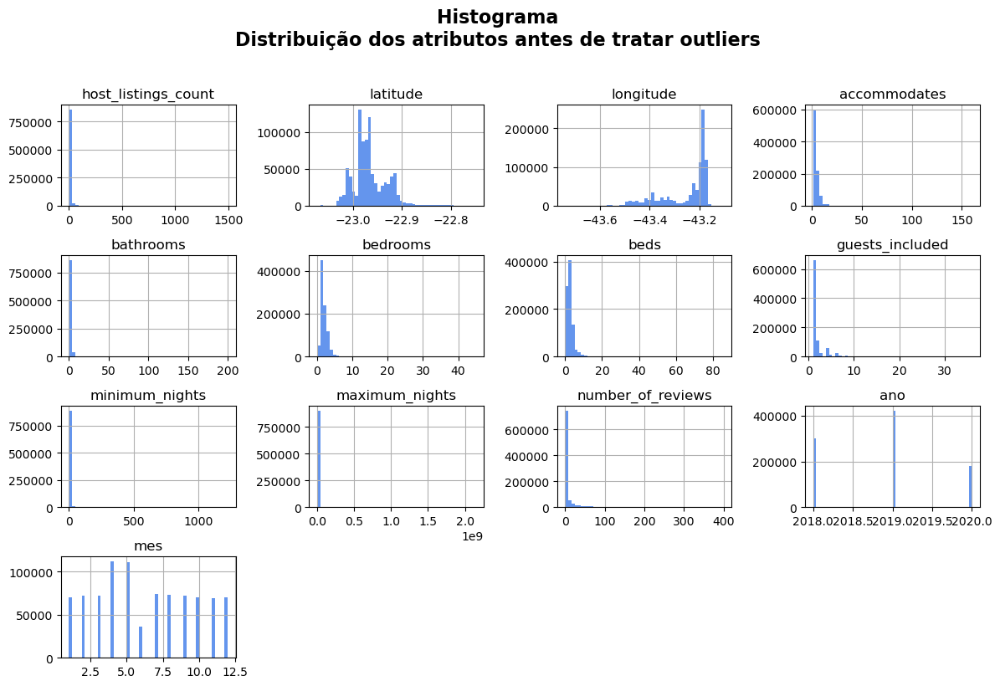

In [24]:
# Filtra somente colunas numéricas
colunas_numericas = df_original.select_dtypes(include=['int64', 'float64'])

# Gera os histogramas
colunas_numericas.hist(bins=50, figsize=(12, 8), color='cornflowerblue')

plt.suptitle('Histograma\nDistribuição dos atributos antes de tratar outliers', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

Já é possível notar que algumas colunas apresentam a maior parte dos dados concentrados em uma faixa específica, o que evidencia a presença de outliers. Abordaremos esse aspecto com mais detalhes nas próximas seções.

### Definição de Funções para Análise de Outliers

Antes de analisar as variáveis numéricas mais relevantes, é importante garantir que os dados estejam limpos e representem bem a realidade. Um dos principais cuidados nesse processo é lidar com os outliers: valores que fogem completamente do padrão da maioria dos dados.

Outliers são pontos extremos que podem surgir por erro de digitação, exceções raras ou características muito específicas de um imóvel. Por exemplo, um anúncio com 1.000 noites mínimas de reserva ou um preço absurdamente alto pode distorcer médias, gráficos e qualquer análise estatística.

Uma forma prática de identificá-los é utilizando o intervalo interquartil (IQR), um método simples e eficaz. O processo envolve calcular:
- primeiro quartil (Q1), que representa os 25% menores valores, e
- terceiro quartil (Q3), que representa os 75%.

A diferença entre eles nos dá o IQR, que serve como base para definir os limites aceitáveis. A partir disso, qualquer valor abaixo de Q1–1.5 × IQR ou acima de Q3 + 1.5 × IQR é considerado um outlier e pode ser removido do dataset.

Esse tipo de limpeza ajuda a evitar distorções em análises estatísticas, garantindo que os resultados sejam mais consistentes e realistas.

In [25]:

def limites(coluna):
    q1 = coluna.quantile(0.25)  # Primeiro quartil
    q3 = coluna.quantile(0.75)  # Terceiro quartil
    amplitude = q3 - q1  # Amplitude interquartil
    return q1 - 1.5 * amplitude, q3 + 1.5 * amplitude  # Limites inferior e superior


def excluir_outliers(df, nome_coluna):
    qtde_linhas = df.shape[0]  # Pega a quantidade de linhas atuais
    lim_inf, lim_sup = limites(df[nome_coluna])  # Calcula os limites inferior e superior para a coluna
    df = df.loc[(df[nome_coluna] >= lim_inf) & (df[nome_coluna] <= lim_sup), :]  # Filtra os dados
    linhas_removidas = qtde_linhas - df.shape[0]  # Calcula o número de linhas removidas
    return df, linhas_removidas  # Retorna o DataFrame filtrado e o número de linhas removidas


### FUNÇÕES DE GRÁFICO

In [26]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns


def diagrama_caixa(coluna):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(10, 1)
    sns.boxplot(x=coluna, ax=ax1)
    ax2.set_xlim(limites(coluna))
    sns.boxplot(x=coluna, ax=ax2)

    
def histograma(coluna):
    plt.figure(figsize=(15, 5))
    sns.histplot(coluna, bins=30, kde=False)  # kde=True para curva de densidade
    plt.title(f'Histograma de {coluna.name}')
    plt.xlabel(coluna.name)
    plt.ylabel('Frequência')
    plt.show()

def histograma_matplotlib(coluna, ax, bins=30, color='cornflowerblue'):
    ax.hist(coluna, bins=bins, color=color)
    ax.set_title(f'Histograma de {coluna.name}')
    ax.set_xlabel(coluna.name)
    ax.set_ylabel('Frequência')

def grafico_barra(coluna):  
    plt.figure(figsize=(15, 5))
    ax = sns.barplot(x=coluna.value_counts().index, y=coluna.value_counts())
    ax.set_xlim(limites(coluna))

def grafico_barras(coluna):  
    # Contagem dos valores
    conta_valores = coluna.value_counts().reset_index()
    conta_valores.columns = ['Valor', 'Contagem']  # Renomeando as colunas
    
    # Definindo os limites
    lim_inf, lim_sup = limites(coluna)
    
    # Criando o gráfico de barras verticais com categorias no eixo Y
    fig = px.bar(conta_valores, y='Valor', x='Contagem', 
                 title=f'Contagem de valores em {coluna.name}')
    
    # Ajustando os limites do eixo X
    fig.update_layout(
        xaxis_title='Contagem', 
        yaxis_title='Categorias', 
        showlegend=False, 
        xaxis=dict(range=[lim_inf, lim_sup])
    )
    
    fig.show()


### Excluindo atributos irrelevantes

Para investigar melhor, utilizei a visualização por meio de boxplots que são ótimas ferramentas para identificar outliers, que aparecem como pontos fora da caixa. Esses valores extremos não só distorcem a percepção visual, comprimindo os quartis, como também influenciam medidas como a média, comprometendo a interpretação dos dados.

Diante disso, optei por tratar esses outliers para garantir análises mais representativas da realidade.

### price

c:\Users\fabio\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


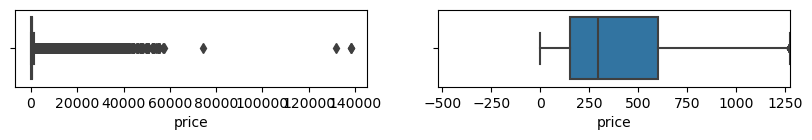

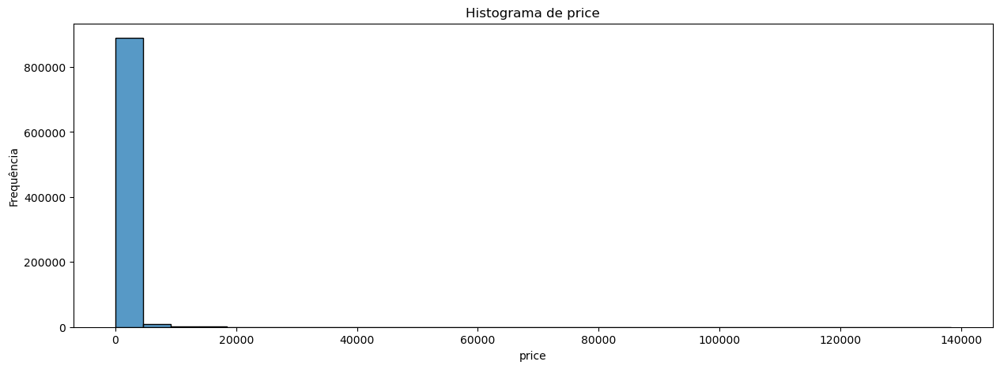

In [27]:
diagrama_caixa(base_airbnb['price'])
histograma(base_airbnb['price'])

Como o modelo tem como foco imóveis mais comuns, é provável que os valores acima do limite superior representem apenas apartamentos de altíssimo luxo, que fogem do escopo principal. Por isso, optei por remover esses outliers.

Após a limpeza, replotei os histogramas para observar as distribuições sem a interferência dos outliers. As mudanças visuais foram significativas, principalmente na coluna price.

87575 linhas removidas


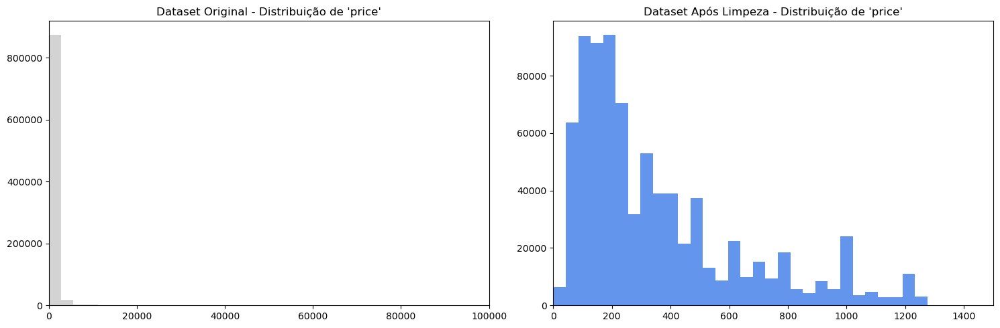

In [28]:
import matplotlib.pyplot as plt


base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'price')
print('{} linhas removidas'.format(linhas_removidas))

# Criando os subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Dataset Original - price
axs[0].hist(df_original['price'], bins=50, color='lightgray')
axs[0].set_title("Dataset Original - Distribuição de 'price'")
axs[0].set_xlim([0, 100000])

# Dataset Limpo - price
axs[1].hist(base_airbnb['price'], bins=30, color='cornflowerblue')
axs[1].set_title("Dataset Após Limpeza - Distribuição de 'price'")
axs[1].set_xlim([0, 1500])


plt.tight_layout()
plt.show()


### extra_people

c:\Users\fabio\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


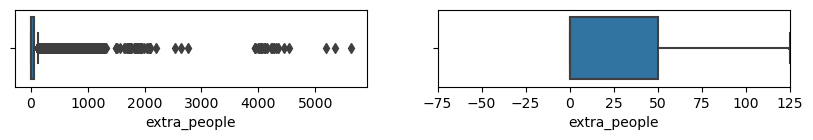

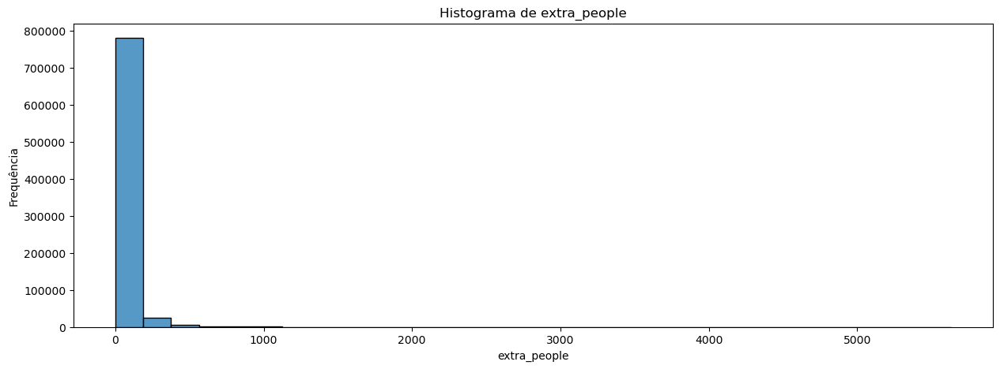

In [29]:
diagrama_caixa(base_airbnb['extra_people'])
histograma(base_airbnb['extra_people'])

Podemos excluir esses outliers da variável extra_people, pois valores excessivamente altos não fazem sentido do ponto de vista prático. É provável que muitos desses casos sejam resultado de preenchimento aleatório ou descuidado por parte do anunciante, sem um critério real. Manter esses dados no modelo pode distorcer a análise e comprometer a qualidade das previsões.

59373 linhas removidas


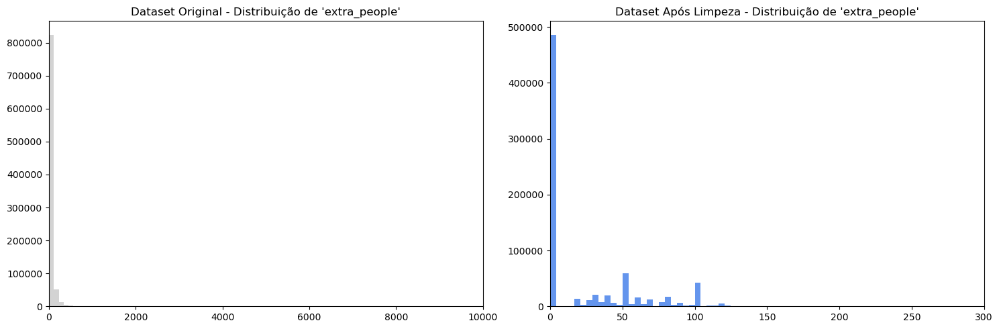

In [30]:
# Limpeza de outliers com suas funções
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'extra_people')
print('{} linhas removidas'.format(linhas_removidas))

# Criando os subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Dataset Original - extra_people
axs[0].hist(df_original['extra_people'], bins=50, color='lightgray')
axs[0].set_title("Dataset Original - Distribuição de 'extra_people'")
axs[0].set_xlim([0, 10000])

# Dataset Limpo - extra_people
axs[1].hist(base_airbnb['extra_people'], bins=30, color='cornflowerblue')
axs[1].set_title("Dataset Após Limpeza - Distribuição de 'extra_people'")
axs[1].set_xlim([0, 300])

plt.tight_layout()
plt.show()


### host_listings_count

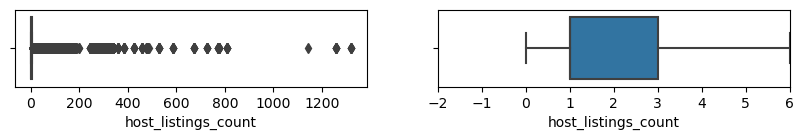

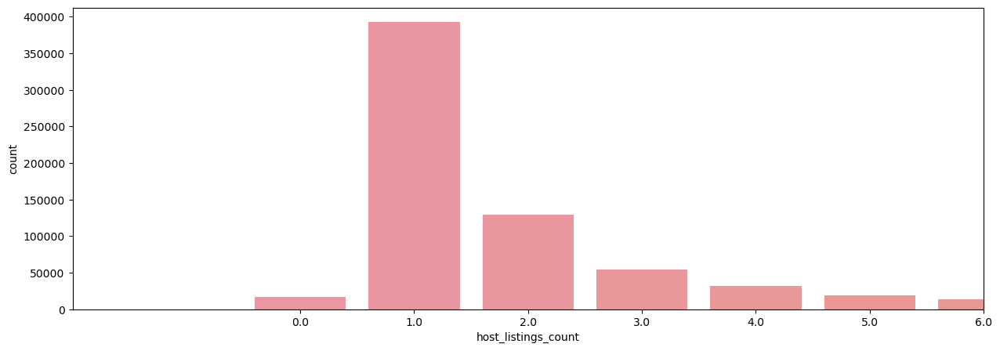

In [31]:
diagrama_caixa(base_airbnb['host_listings_count'])
grafico_barra(base_airbnb['host_listings_count'])

Podemos excluir esses outliers, pois o objetivo do projeto não é voltado para hosts com mais de 6 imóveis no Airbnb. Esse perfil, geralmente composto por imobiliárias ou profissionais que gerenciam diversos imóveis, não representa o público-alvo que buscamos modelar.

98749 linhas removidas


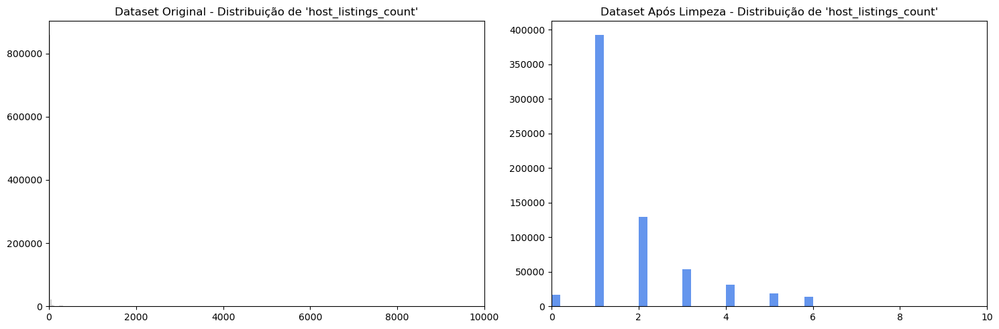

In [32]:
# Limpeza de outliers com suas funções
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'host_listings_count')
print('{} linhas removidas'.format(linhas_removidas))

# Criando os subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Dataset Original - host_listings_count
axs[0].hist(df_original['host_listings_count'], bins=50, color='lightgray')
axs[0].set_title("Dataset Original - Distribuição de 'host_listings_count'")
axs[0].set_xlim([0, 10000])

# Dataset Limpo - host_listings_count
axs[1].hist(base_airbnb['host_listings_count'], bins=30, color='cornflowerblue')
axs[1].set_title("Dataset Após Limpeza - Distribuição de 'host_listings_count'")
axs[1].set_xlim([0, 10])

plt.tight_layout()
plt.show()

### accommodates

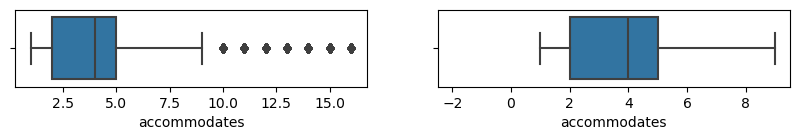

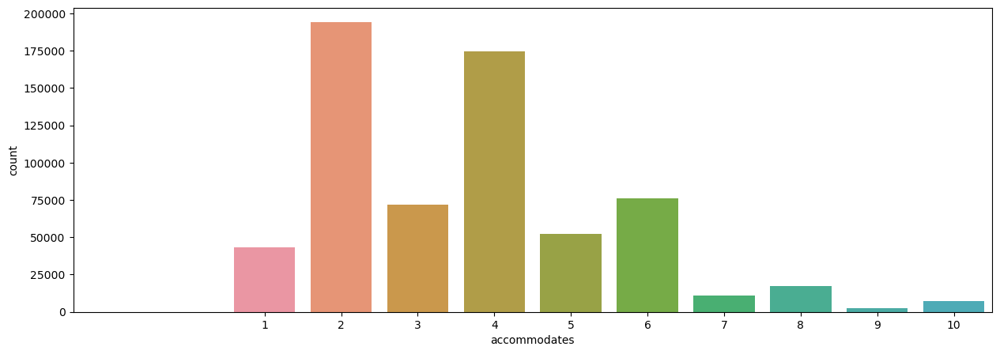

In [33]:
diagrama_caixa(base_airbnb['accommodates'])
grafico_barra(base_airbnb['accommodates'])

Pelo mesmo motivo do host_listing_couunt, decidi excluir os outliers da variável accommodates , já que apartamentos que acomodam mais de 9 pessoas não fazem parte do foco deste projeto. Meu objetivo é construir um modelo voltado para imóveis comuns.
Caso eu quisesse incluir imóveis de alto padrão, poderia manter esses valores ou, então, desenvolver um modelo específico para propriedades com mais de 9 hóspedes.

13183 linhas removidas


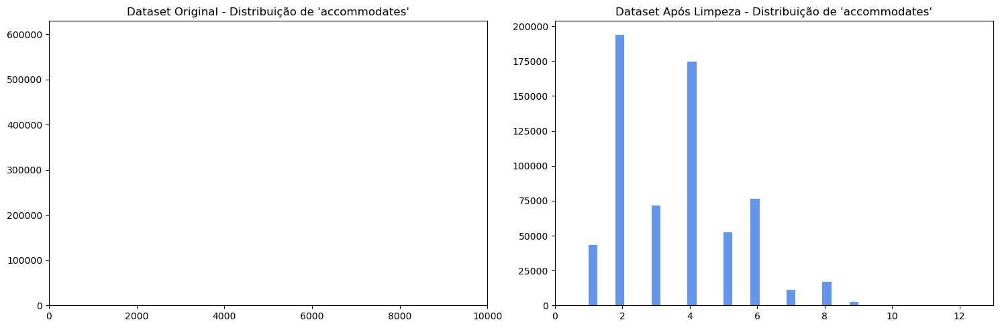

In [34]:
# Limpeza de outliers com suas funções
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'accommodates')
print('{} linhas removidas'.format(linhas_removidas))

# Criando os subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Dataset Original - accommodates
axs[0].hist(df_original['accommodates'], bins=50, color='lightgray')
axs[0].set_title("Dataset Original - Distribuição de 'accommodates'")
axs[0].set_xlim([0, 10000])

# Dataset Limpo - accommodates
axs[1].hist(base_airbnb['accommodates'], bins=30, color='cornflowerblue')
axs[1].set_title("Dataset Após Limpeza - Distribuição de 'accommodates'")
axs[1].set_xlim([0, 13])

plt.tight_layout()
plt.show()

### bathrooms 

<Axes: xlabel='bathrooms', ylabel='count'>

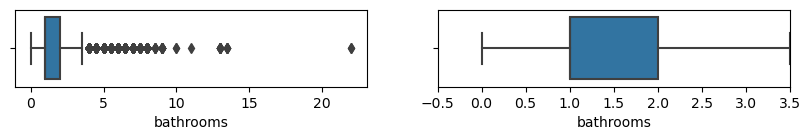

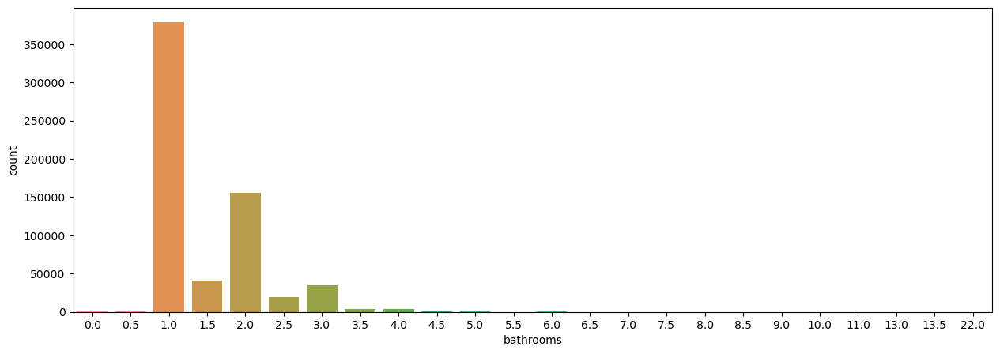

In [35]:
diagrama_caixa(base_airbnb['bathrooms'])
plt.figure(figsize=(15, 5))
sns.barplot(x=base_airbnb['bathrooms'].value_counts().index, y=base_airbnb['bathrooms'].value_counts())

- Pelo mesmo motivo dos anteriores, vamos excluir os outliers nos banheiros

8131 linhas removidas


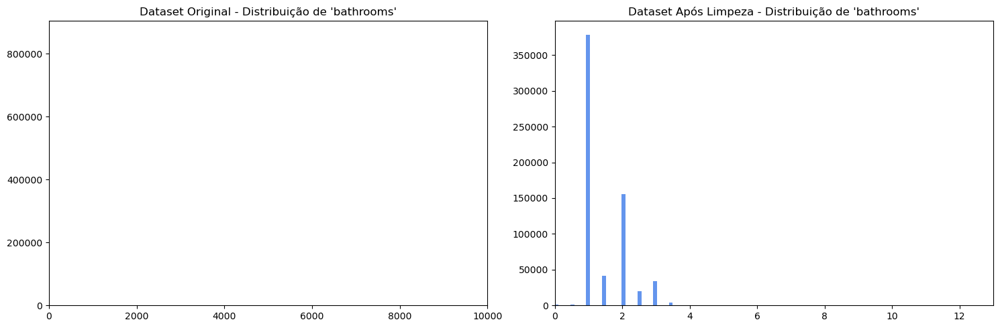

In [36]:
# Limpeza de outliers com suas funções
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bathrooms')
print('{} linhas removidas'.format(linhas_removidas))

# Criando os subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Dataset Original - bathrooms
axs[0].hist(df_original['bathrooms'], bins=50, color='lightgray')
axs[0].set_title("Dataset Original - Distribuição de 'bathrooms'")
axs[0].set_xlim([0, 10000])

# Dataset Limpo - bathrooms
axs[1].hist(base_airbnb['bathrooms'], bins=30, color='cornflowerblue')
axs[1].set_title("Dataset Após Limpeza - Distribuição de 'bathrooms'")
axs[1].set_xlim([0, 13])

plt.tight_layout()
plt.show()

### bedrooms

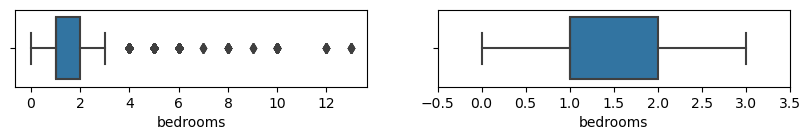

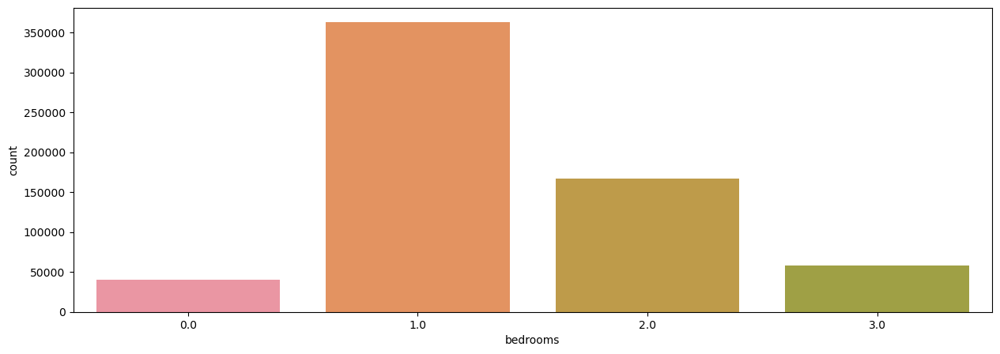

In [37]:
diagrama_caixa(base_airbnb['bedrooms'])
grafico_barra(base_airbnb['bedrooms'])

- Pelo mesmo motivo dos anteriores, vamos excluir outliers em quantidade de quartos

6043 linhas removidas


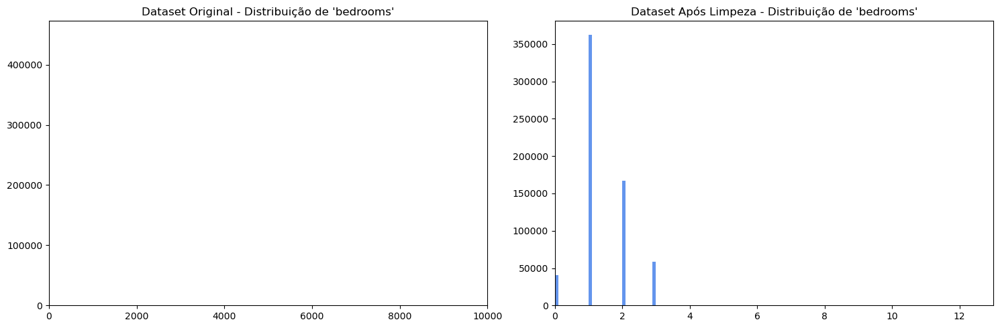

In [38]:
# Limpeza de outliers com suas funções
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bedrooms')
print('{} linhas removidas'.format(linhas_removidas))

# Criando os subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Dataset Original - bedrooms
axs[0].hist(df_original['bedrooms'], bins=50, color='lightgray')
axs[0].set_title("Dataset Original - Distribuição de 'bedrooms'")
axs[0].set_xlim([0, 10000])

# Dataset Limpo - bedrooms
axs[1].hist(base_airbnb['bedrooms'], bins=30, color='cornflowerblue')
axs[1].set_title("Dataset Após Limpeza - Distribuição de 'bedrooms'")
axs[1].set_xlim([0, 13])

plt.tight_layout()
plt.show()

### beds

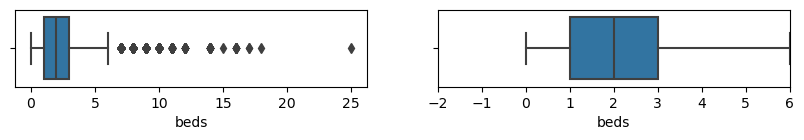

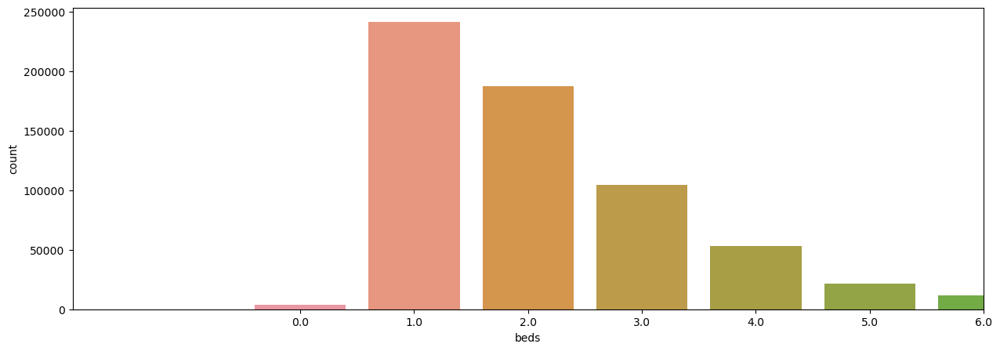

In [39]:
diagrama_caixa(base_airbnb['beds'])
grafico_barra(base_airbnb['beds'])

- Pelo mesmo motivo dos anteriores, vamos excluir outliers em quantidade de camas

6790 linhas removidas


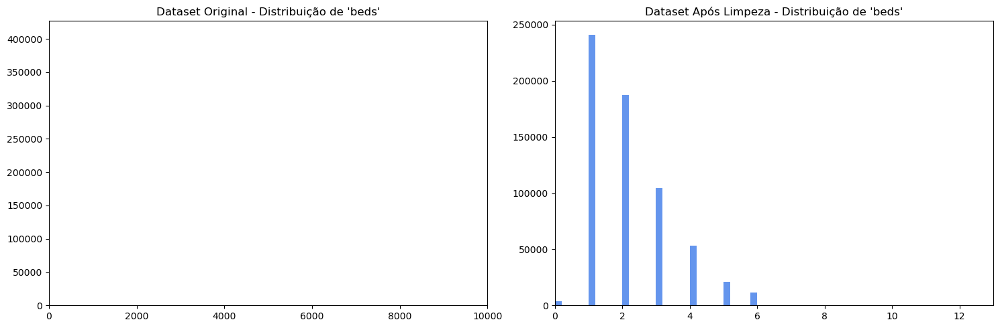

In [40]:
# Limpeza de outliers com suas funções
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'beds')
print('{} linhas removidas'.format(linhas_removidas))

# Criando os subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Dataset Original - beds
axs[0].hist(df_original['beds'], bins=50, color='lightgray')
axs[0].set_title("Dataset Original - Distribuição de 'beds'")
axs[0].set_xlim([0, 10000])

# Dataset Limpo - beds
axs[1].hist(base_airbnb['beds'], bins=30, color='cornflowerblue')
axs[1].set_title("Dataset Após Limpeza - Distribuição de 'beds'")
axs[1].set_xlim([0, 13])

plt.tight_layout()
plt.show()

### guests_included

(1.0, 1.0)


<Axes: xlabel='guests_included', ylabel='count'>

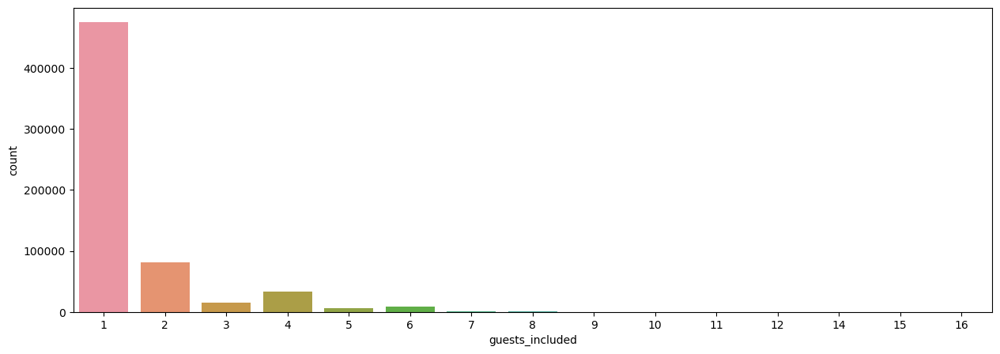

In [41]:
#diagrama_caixa(base_airbnb['guests_included'])
#grafico_barra(base_airbnb['guests_included'])
print(limites(base_airbnb['guests_included']))
plt.figure(figsize=(15, 5))
sns.barplot(x=base_airbnb['guests_included'].value_counts().index, y=base_airbnb['guests_included'].value_counts())

Vou remover essa variável da análise. Percebi que muitos usuários do Airbnb mantêm o valor padrão de '1 hóspede incluído', o que pode levar o modelo a considerar uma feature que, na prática, não influencia tanto no preço. Por isso, acredito ser mais adequado excluir essa coluna.

In [42]:
base_airbnb = base_airbnb.drop('guests_included', axis=1)
base_airbnb.shape

(622366, 23)

### minimum_nights

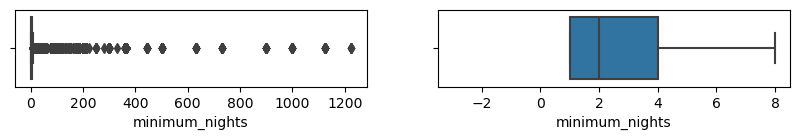

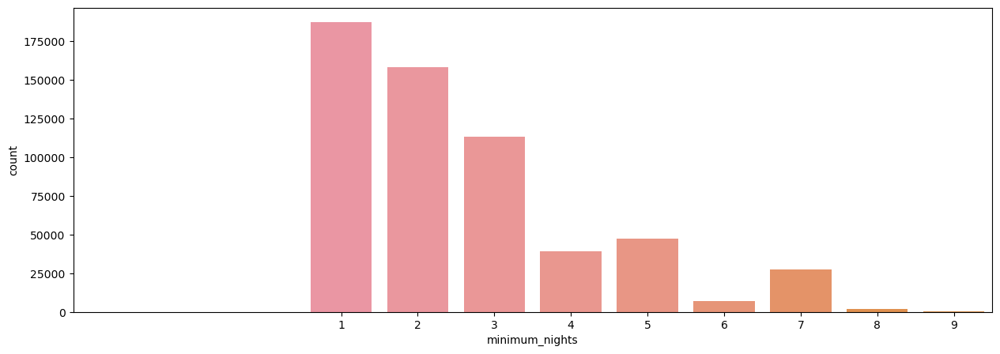

In [43]:
diagrama_caixa(base_airbnb['minimum_nights'])
grafico_barra(base_airbnb['minimum_nights'])

Aqui eu tenho um motivo talvez ainda mais forte para excluir esses apartamentos da análise.
Como meu objetivo é construir um modelo que ajude na precificação de imóveis comuns do tipo que uma pessoa comum gostaria de anunciar, imóveis com mais de 8 noites como exigência mínima fogem desse perfil. Eles podem estar voltados para aluguel de temporada prolongada ou até moradia, onde o host exige pelo menos um mês de estadia.
Por isso, decidi excluir os outliers dessa coluna.

40383 linhas removidas


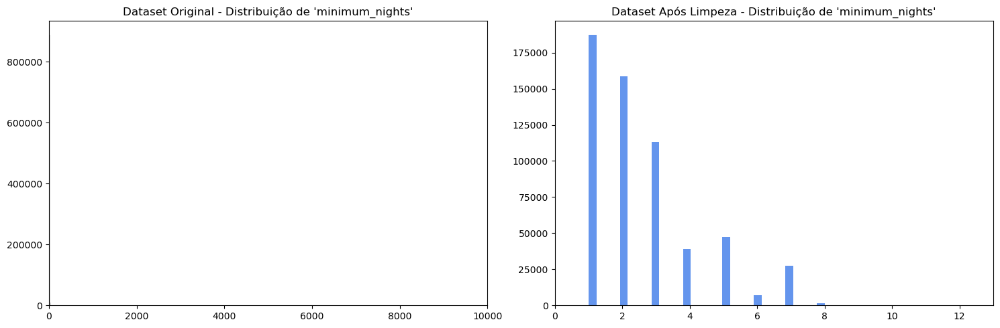

In [44]:
# Limpeza de outliers com suas funções
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'minimum_nights')
print('{} linhas removidas'.format(linhas_removidas))

# Criando os subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Dataset Original - minimum_nights
axs[0].hist(df_original['minimum_nights'], bins=50, color='lightgray')
axs[0].set_title("Dataset Original - Distribuição de 'minimum_nights'")
axs[0].set_xlim([0, 10000])

# Dataset Limpo - minimum_nights
axs[1].hist(base_airbnb['minimum_nights'], bins=30, color='cornflowerblue')
axs[1].set_title("Dataset Após Limpeza - Distribuição de 'minimum_nights'")
axs[1].set_xlim([0, 13])

plt.tight_layout()
plt.show()

### maximum_nights

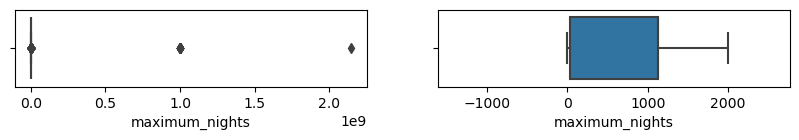

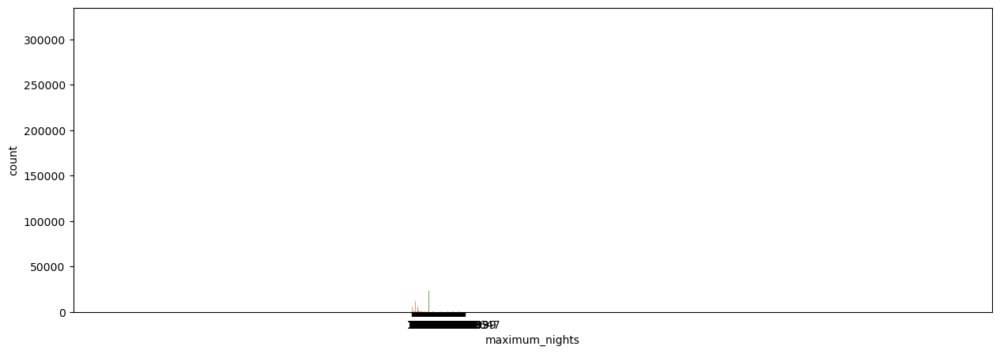

In [45]:
diagrama_caixa(base_airbnb['maximum_nights'])
grafico_barra(base_airbnb['maximum_nights'])

Essa coluna não me parece útil para a análise.
Percebo que a maioria dos hosts nem preenche o campo maximum nights, o que indica que essa informação pode não ser relevante para definir o preço do imóvel. 
Diante disso, prefiro excluir essa coluna da análise.

In [46]:
base_airbnb = base_airbnb.drop('maximum_nights', axis=1)
base_airbnb.shape

(581983, 22)

### number_of_reviews            

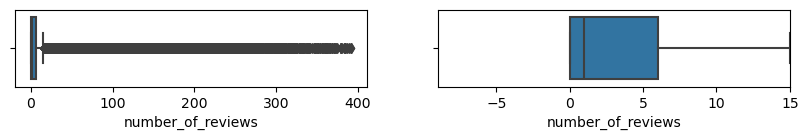

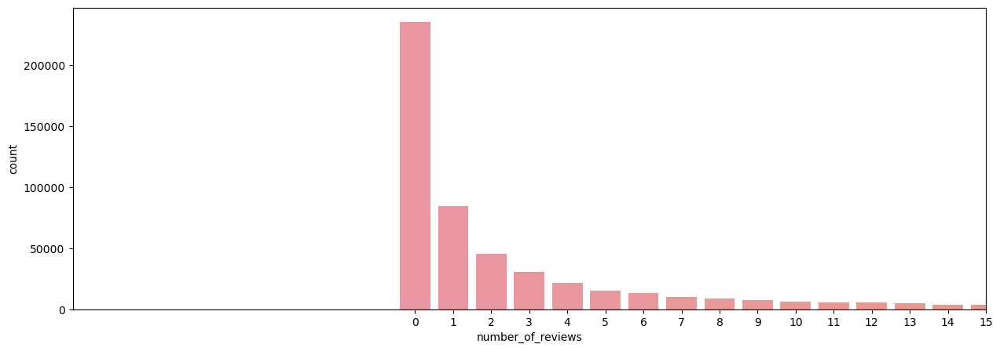

In [47]:
diagrama_caixa(base_airbnb['number_of_reviews'])
grafico_barra(base_airbnb['number_of_reviews'])

Aqui eu poderia seguir por alguns caminhos diferentes, mas decidi remover essa característica da análise com base em alguns pontos:
1. Se eu simplesmente excluir os outliers, vou acabar tirando justamente os hosts com maior quantidade de reviews, que, em geral, são os que mais alugam. Isso poderia afetar negativamente o desempenho do modelo;
3. Pensando no objetivo do projeto, se eu sou uma pessoa comum tentando alugar meu imóvel, é provável que eu ainda não tenha nenhuma review. Então, talvez remover essa variável possa até melhorar o modelo para esse público.

De forma geral, ainda tenho dúvidas se essa característica deveria ou não influenciar o preço final, então prefiro não considerá-la por enquanto.

In [48]:
base_airbnb = base_airbnb.drop('number_of_reviews', axis=1)
base_airbnb.shape

(581983, 21)

### Tratamento de Colunas de Valores de Texto


### - property_type 

property_type
Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                     

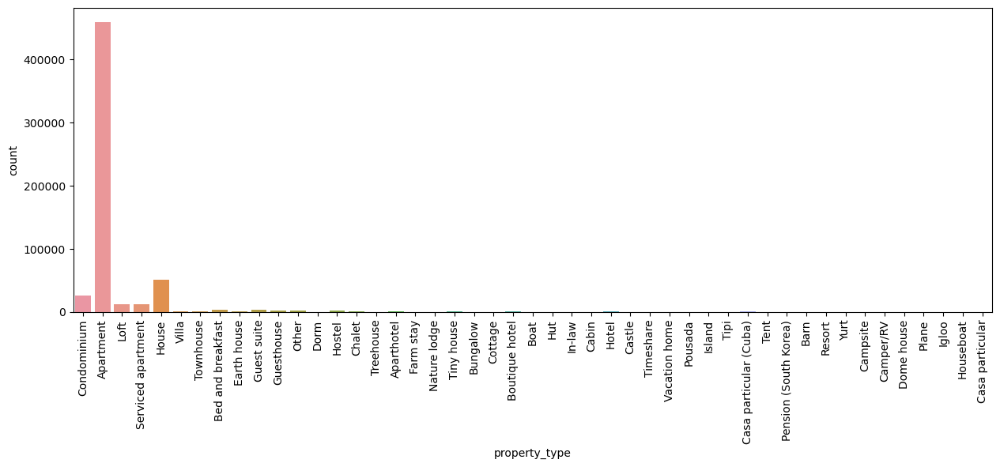

In [49]:
print(base_airbnb['property_type'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='property_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

- Aqui a nossa ação não é "excluir outliers", mas sim agrupar valores que são muito pequenos.
- Todos os tipos de propriedade que têm menos de 2.000 propriedades na base de dados, eu vou agrupar em um grupo chamado "outros". Acho que isso vai facilitar o modelo.

['Other', 'Villa', 'Townhouse', 'Aparthotel', 'Chalet', 'Earth house', 'Tiny house', 'Boutique hotel', 'Hotel', 'Casa particular (Cuba)', 'Cottage', 'Bungalow', 'Dorm', 'Cabin', 'Nature lodge', 'Castle', 'Treehouse', 'Island', 'Boat', 'Hut', 'Campsite', 'Resort', 'Camper/RV', 'Yurt', 'Tent', 'Tipi', 'Barn', 'Farm stay', 'Pension (South Korea)', 'Dome house', 'Igloo', 'In-law', 'Vacation home', 'Timeshare', 'Pousada', 'Houseboat', 'Casa particular', 'Plane']
property_type
Apartment             458354
House                  51387
Condominium            26456
Serviced apartment     12671
Loft                   12352
Outros                  8850
Guest suite             3621
Bed and breakfast       3472
Hostel                  2665
Guesthouse              2155
Name: count, dtype: int64


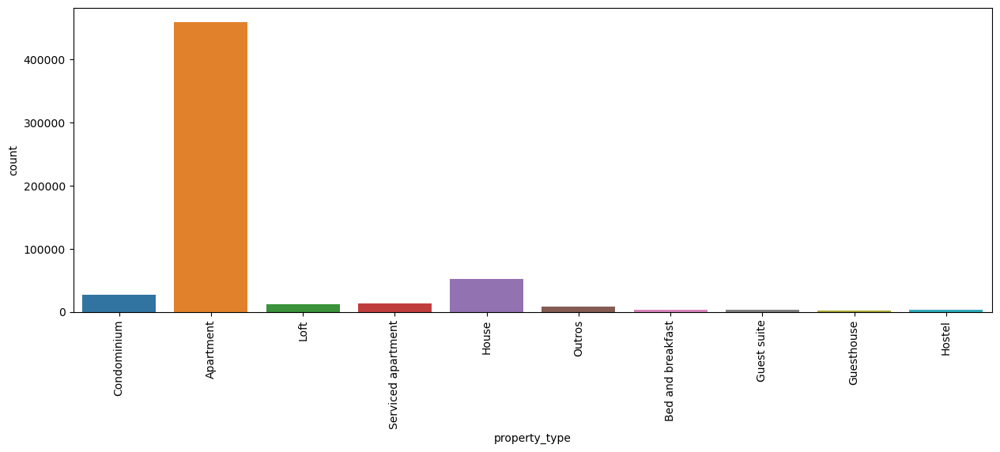

In [50]:
tabela_tipos_casa = base_airbnb['property_type'].value_counts()
colunas_agrupar = []

for tipo in tabela_tipos_casa.index:
    if tabela_tipos_casa[tipo] < 2000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar)

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['property_type']==tipo, 'property_type'] = 'Outros'

print(base_airbnb['property_type'].value_counts())
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='property_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

### - room_type 

room_type
Entire home/apt    372443
Private room       196859
Shared room         11714
Hotel room            967
Name: count, dtype: int64


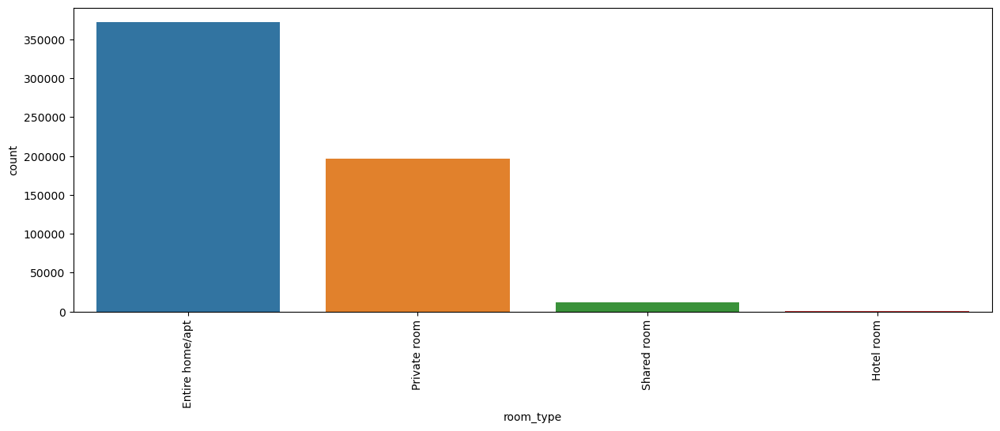

In [51]:
print(base_airbnb['room_type'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='room_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

Em tipo de quarto, não precisamos fazer nada, ele já parece estar bem distribuído

### - bed_type 

bed_type
Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: count, dtype: int64
['Pull-out Sofa', 'Futon', 'Airbed', 'Couch']
bed_type
Real Bed    570643
Outros       11340
Name: count, dtype: int64


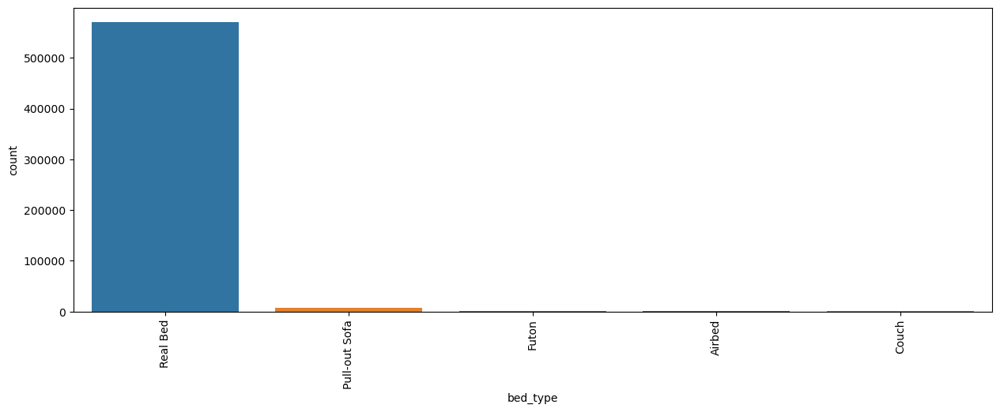

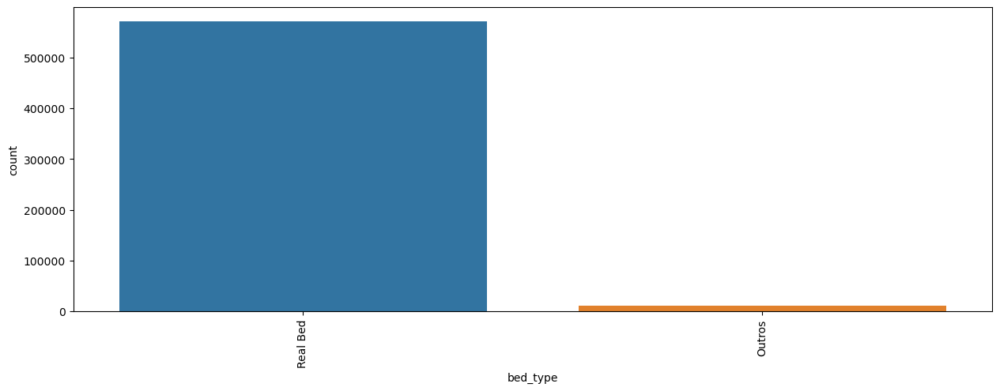

In [52]:
print(base_airbnb['bed_type'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='bed_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

# agrupando categorias de bed_type
tabela_bed = base_airbnb['bed_type'].value_counts()
colunas_agrupar = []

for tipo in tabela_bed.index:
    if tabela_bed[tipo] < 10000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar)

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['bed_type']==tipo, 'bed_type'] = 'Outros'

print(base_airbnb['bed_type'].value_counts())
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='bed_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

Aqui a nossa ação não é "excluir outliers", mas sim agrupar valores que são muito pequenos. Como temos 1 valor claramente MUITO maior do que todos os outros, vou criar apenas 2 grupos de camas: "Real Bed" e "outros" Isso vai simplificar o modelo

### - cancellation_policy 

Neste caso, nossa ação não será excluir outliers, mas sim agrupar categorias com pouca representatividade. Como temos dois valores com a política de cancelamento iniciando por "strict" que são significativamente menos frequentes que os demais, optei por unificá-los com o grupo denominado "strict". Essa simplificação ajuda a reduzir a complexidade do modelo sem perder informações relevantes.

cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: count, dtype: int64
['strict', 'super_strict_60', 'super_strict_30']
cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9863
Name: count, dtype: int64


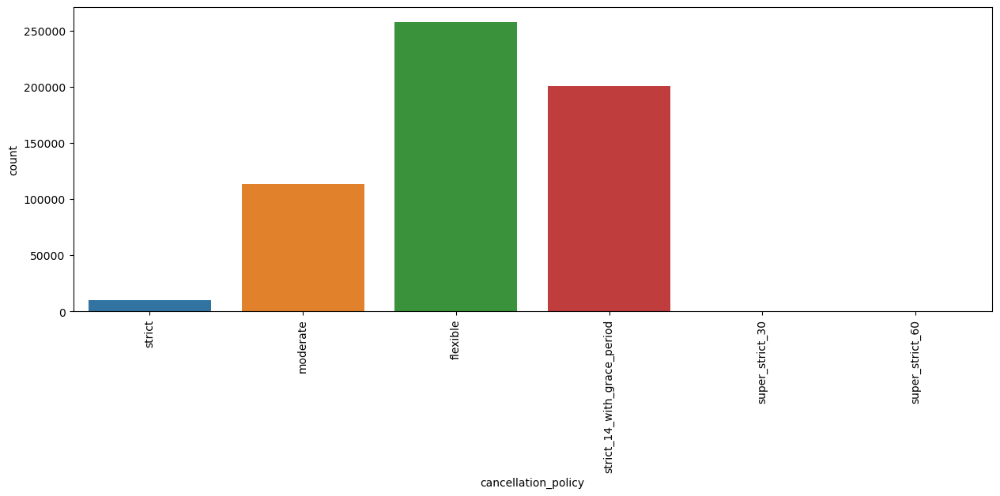

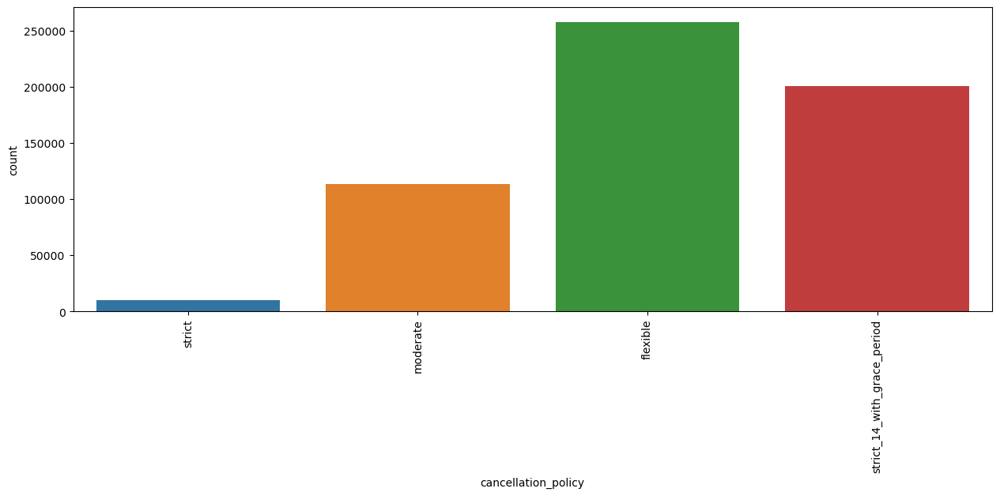

In [53]:
print(base_airbnb['cancellation_policy'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='cancellation_policy', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

# agrupando categorias de cancellation_pollicy
tabela_cancellation = base_airbnb['cancellation_policy'].value_counts()
colunas_agrupar = []

for tipo in tabela_cancellation.index:
    if tabela_cancellation[tipo] < 10000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar)

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['cancellation_policy']==tipo, 'cancellation_policy'] = 'strict'

print(base_airbnb['cancellation_policy'].value_counts())
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='cancellation_policy', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

### - amenities 

Ao analisar os valores da coluna amenities, percebi alguns pontos importantes:
- Cada linha da coluna representa um set de comodidades;
- Esses sets contêm itens descritos como strings, mas nem sempre padronizados;
- Como o preenchimento é feito manualmente pelos locadores, há muita subjetividade.

Por exemplo, um locador pode considerar que ter uma cozinha é uma comodidade e, por isso, descrevê-la em amenities. Já outro pode entender que a cozinha é um item básico do apartamento e nem mencioná-la. Além disso, diferentes locadores podem descrever a mesma comodidade de maneiras distintas.

Por isso, optei por uma abordagem mais simples e prática: ao invés de analisar quais comodidades estão listadas, vou considerar apenas quantas foram informadas.

A ideia é verificar se há uma correlação entre o número de comodidades, o que pode indicar maior detalhamento do locador e o valor do imóvel. O modelo nos ajudará a confirmar se essa suposição faz sentido.

In [54]:
print(base_airbnb['amenities'].iloc[1].split(','))
print(len(base_airbnb['amenities'].iloc[1].split(',')))

base_airbnb['n_amenities'] = base_airbnb['amenities'].str.split(',').apply(len)

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', 'Doorman', 'Elevator', '"Buzzer/wireless intercom"', '"Family/kid friendly"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"}']
14


In [55]:
base_airbnb = base_airbnb.drop('amenities', axis=1)
base_airbnb.shape

(581983, 21)

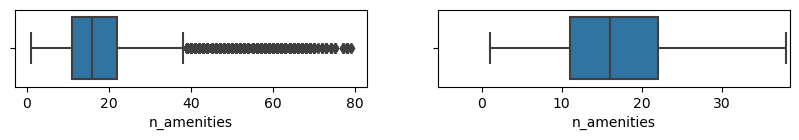

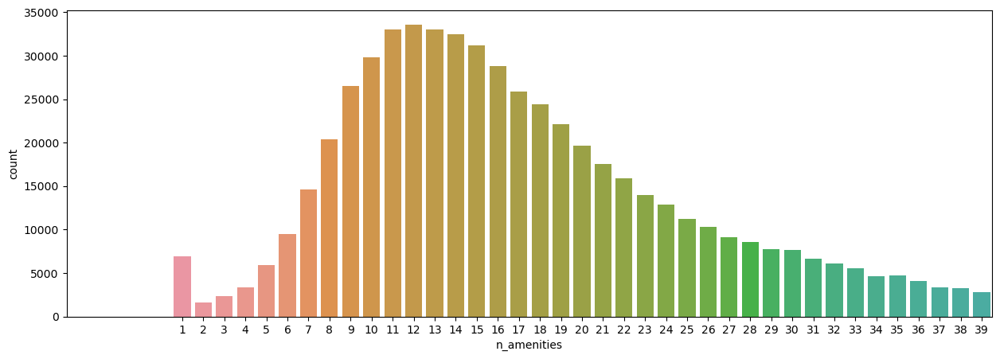

In [56]:
diagrama_caixa(base_airbnb['n_amenities'])
grafico_barra(base_airbnb['n_amenities'])

Então, essa virou uma coluna de valor numérico e, como todas as outras colunas de valores numéricos, eu exclui outliers com os mesmos modelos anteriores

24343 linhas removidas


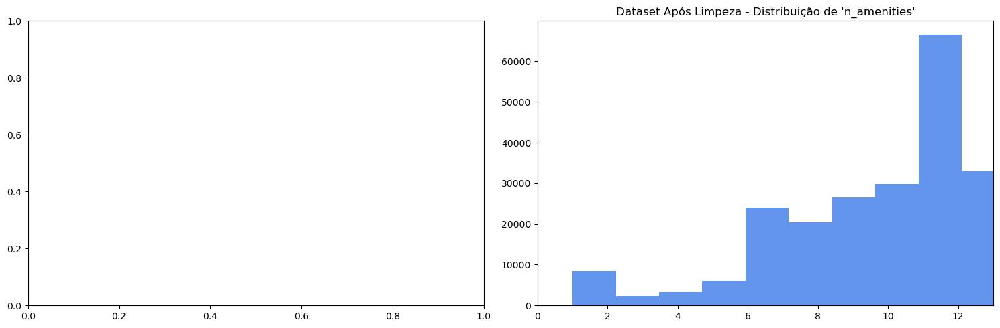

In [57]:
# Limpeza de outliers com suas funções
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'n_amenities')
print('{} linhas removidas'.format(linhas_removidas))

# Criando os subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))


# Dataset Limpo - n_amenities
axs[1].hist(base_airbnb['n_amenities'], bins=30, color='cornflowerblue')
axs[1].set_title("Dataset Após Limpeza - Distribuição de 'n_amenities'")
axs[1].set_xlim([0, 13])

plt.tight_layout()
plt.show()

### Análise Exploratória

Nesta etapa vamos realizar uma análise exploratória para conhecermos os dados.

In [58]:
# informações a respeito do tipo de dado das variáveis
base_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 557640 entries, 1 to 902209
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   host_is_superhost         557640 non-null  object 
 1   host_listings_count       557640 non-null  float64
 2   neighbourhood             520406 non-null  object 
 3   latitude                  557640 non-null  float64
 4   longitude                 557640 non-null  float64
 5   property_type             557640 non-null  object 
 6   room_type                 557640 non-null  object 
 7   accommodates              557640 non-null  int64  
 8   bathrooms                 557640 non-null  float64
 9   bedrooms                  557640 non-null  float64
 10  beds                      557640 non-null  float64
 11  bed_type                  557640 non-null  object 
 12  price                     557640 non-null  float32
 13  extra_people              557640 non-null  float3

In [59]:
base_airbnb[['price', 'minimum_nights']].describe()

,price,minimum_nights
count,557640.000000,557640.000000
mean,322.577301,2.559339
std,264.212036,1.651428
min,0.000000,1.000000
25%,139.000000,1.000000
50%,229.000000,2.000000
75%,402.000000,3.000000
max,1276.000000,8.000000


### Histograma Distribuição dos atributos após tratar outliers:

Após a limpeza dos dados, vamos observar novamente os histogramas para visualizar como ficou a distribuição de todas as features. Essa etapa é importante para verificar se os tratamentos aplicados, como a remoção de outliers e a exclusão ou consolidação de categorias realmente contribuíram para uma distribuição mais equilibrada e adequada ao modelo.

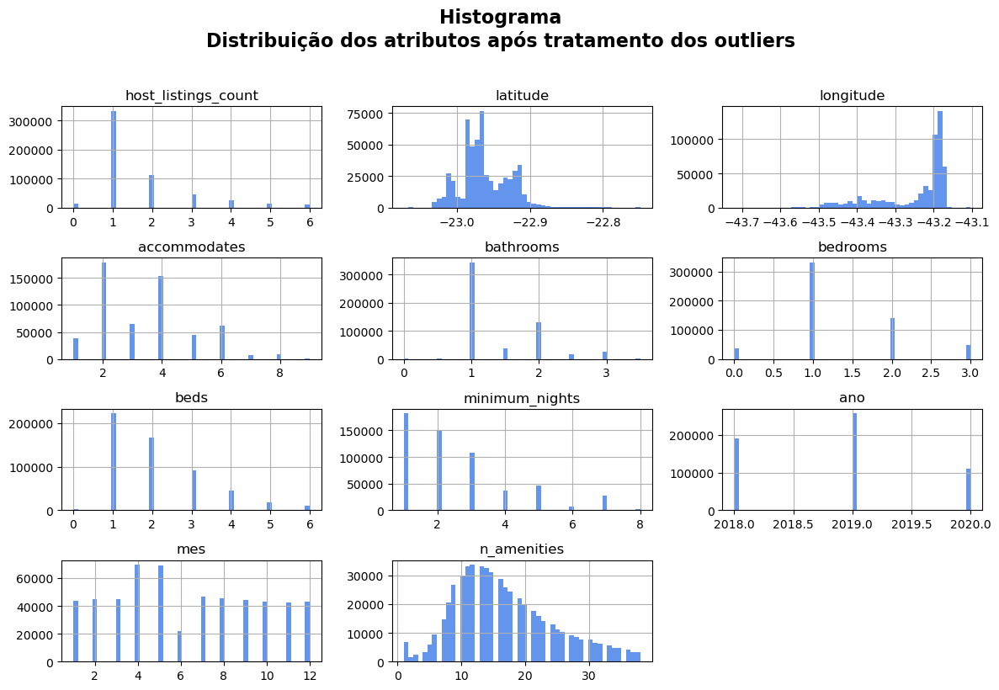

In [60]:
# Filtra somente colunas numéricas
colunas_numericas = base_airbnb.select_dtypes(include=['int64', 'float64'])

# Gera os histogramas
colunas_numericas.hist(bins=50, figsize=(12, 8), color='cornflowerblue')

plt.suptitle('Histograma\nDistribuição dos atributos após tratamento dos outliers', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

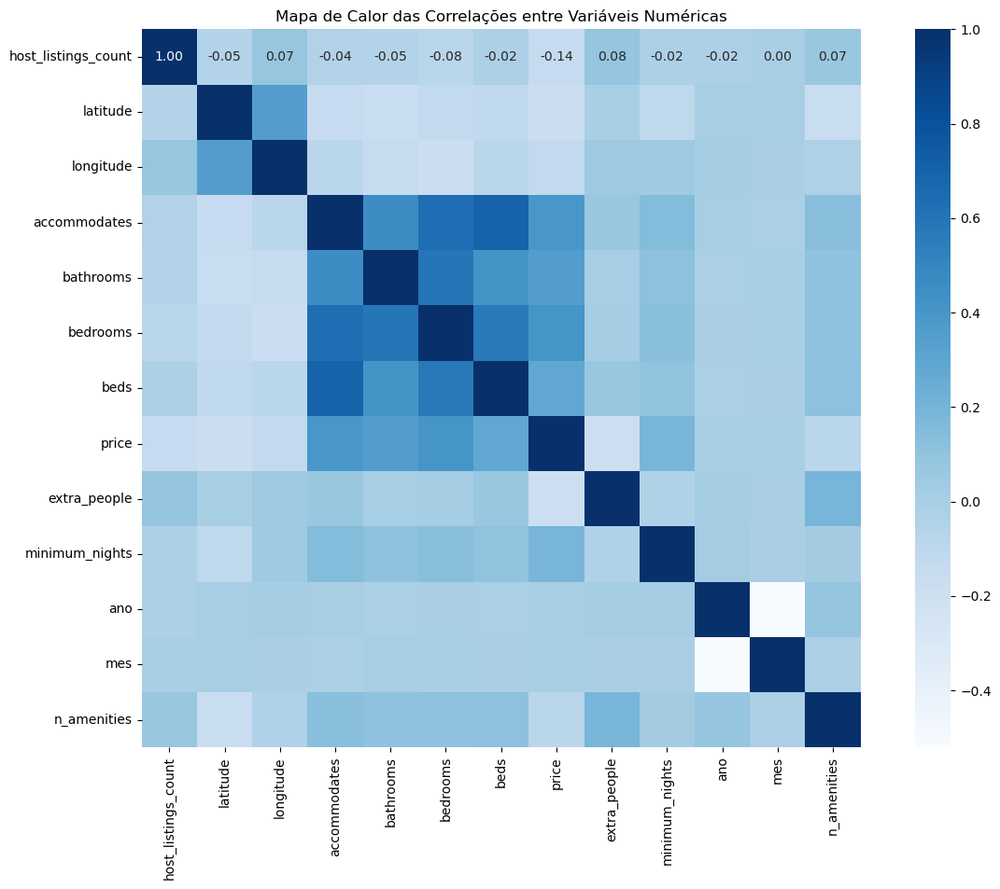

In [81]:
# Gera o heatmap de correlações apenas com colunas numéricas
plt.figure(figsize=(15, 10))
sns.heatmap(
    base_airbnb.corr(numeric_only=True),
    annot=True,           # Mostra os valores dentro dos quadrados
    cmap='Blues',         # Define o esquema de cores
    fmt='.2f',            # Formato numérico com 2 casas decimais
    square=True,          # Mantém os quadrados proporcionais
    linecolor='white'     # Cor das linhas que separam as células
)

plt.title("Mapa de Calor das Correlações entre Variáveis Numéricas")
plt.show()

### Tratar Valores Faltando

In [61]:
((base_airbnb.isnull().sum() / base_airbnb.shape[0])*100).sort_values(ascending=False)

neighbourhood               6.677068
host_is_superhost           0.000000
bed_type                    0.000000
mes                         0.000000
ano                         0.000000
cancellation_policy         0.000000
is_business_travel_ready    0.000000
instant_bookable            0.000000
minimum_nights              0.000000
extra_people                0.000000
price                       0.000000
beds                        0.000000
host_listings_count         0.000000
bedrooms                    0.000000
bathrooms                   0.000000
accommodates                0.000000
room_type                   0.000000
property_type               0.000000
longitude                   0.000000
latitude                    0.000000
n_amenities                 0.000000
dtype: float64

## Qual o tipo de imóvel mais comum?


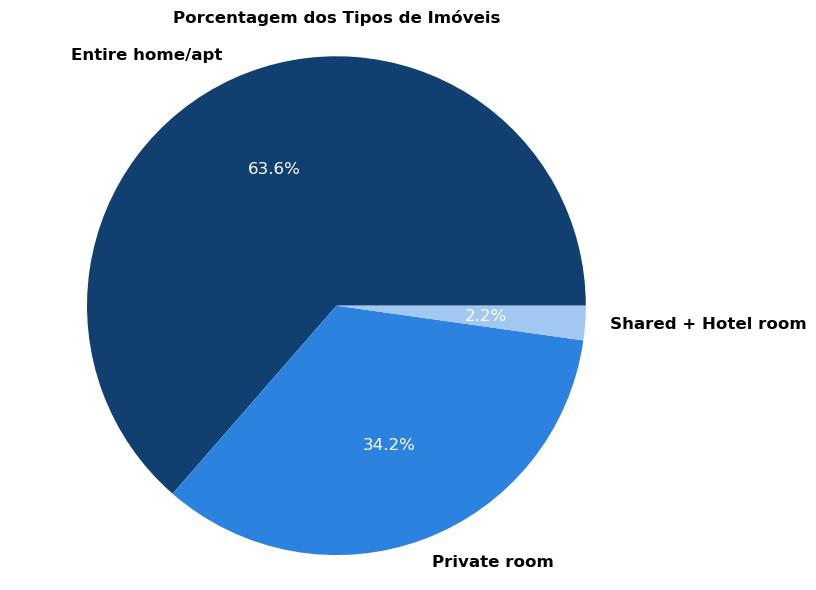

In [62]:
import matplotlib.pyplot as plt

# Agrupando os tipos menos frequentes
room_counts = base_airbnb['room_type'].value_counts()

# Mantendo os dois mais comuns, agrupando os demais
top_labels = room_counts.index[:2]  # Pega os dois primeiros
top_sizes = room_counts.values[:2]  # Pega os valores dos dois primeiros

# Soma das demais categorias
others_size = room_counts.values[2:].sum()
others_label = 'Shared + Hotel room'

# Novas listas com os valores agrupados
labels = list(top_labels) + [others_label]
sizes = list(top_sizes) + [others_size]


# Definindo tons de azul pastel
blue_pastel_colors = ['#113f70', '#2b82df', '#a2c8f1', '#e6f0fb']

# Garantindo que o número de cores seja suficiente para o número de fatias
colors = blue_pastel_colors[:len(labels)]

# Criando o gráfico de pizza
plt.figure(figsize=(8, 6))
wedges, texts, autotexts = plt.pie(
    sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=0, counterclock=True
)


# Deixando os textos em negrito
for text in texts:
    text.set_fontsize(12)
    text.set_fontweight('bold')
    text.set_fontweight('bold')

# Deixando as porcentagens em negrito e colorindo-as de branco
for autotext in autotexts:
    autotext.set_fontsize(12)
    autotext.set_color('white')  # Cor das porcentagens


plt.title('Porcentagem dos Tipos de Imóveis', fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()


In [63]:
import plotly.express as px
import plotly.io as pio

# Volta ao modo interativo no notebook
pio.renderers.default = 'notebook'

# Contagem absoluta dos tipos de imóvel
room_counts = base_airbnb['room_type'].value_counts().reset_index()
room_counts.columns = ['Tipo de Imóvel', 'Contagem']

# Cálculo da porcentagem
total = room_counts['Contagem'].sum()
room_counts['Porcentagem'] = (room_counts['Contagem'] / total) * 100
room_counts['Porcentagem Formatada'] = room_counts['Porcentagem'].apply(lambda x: f'{x:.1f}%')

# Tons de azul pastel
blue_pastel_colors = ['#113f70', '#2b82df', '#a2c8f1', '#e6f0fb']
colors = blue_pastel_colors[:len(room_counts)]

# Criando o gráfico de barras
fig = px.bar(
    room_counts,
    x='Tipo de Imóvel',
    y='Contagem',
    text='Porcentagem Formatada',
    color='Tipo de Imóvel',
    color_discrete_sequence=colors
)

# Ajustando o layout e os rótulos
fig.update_traces(textposition='outside')
fig.update_layout(
    title='Tipos de Imóveis Mais Comuns',
    xaxis_title='Tipo de Imóvel',
    yaxis_title='Número de Ofertas',
    showlegend=False,
    plot_bgcolor='white'
)

fig.show()


Por meio do método value_counts() , verificou-se que:
- Aproximadamente 60% dos aluguéis do Airbnb, no Rio de Janeiro, são de casas ou apartamentos inteiros;
- 34% das propriedades são quartos privativos;
- 2% dos tipos de aluguéis representam Quartos de hotel e quartos compartilhados, juntos.

## Qual a média de preços por tipo de quarto?



In [64]:
import plotly.express as px

# Calculando a média de preço por tipo de imóvel
room_avg_price = base_airbnb.groupby('room_type')['price'].mean().reset_index()
room_avg_price.columns = ['Tipo de Imóvel', 'Preço Médio']

# Formatando os valores para o formato de moeda (R$)
room_avg_price['Preço Médio Formatado'] = room_avg_price['Preço Médio'].apply(lambda x: f'R$ {x:,.2f}')

# Tons de azul pastel
blue_pastel_colors = ['#113f70', '#2b82df', '#a2c8f1', '#e6f0fb']
colors = blue_pastel_colors[:len(room_avg_price)]

# Criando o gráfico de barras com preço médio formatado
fig = px.bar(
    room_avg_price,
    x='Tipo de Imóvel',
    y='Preço Médio',
    color='Tipo de Imóvel',
    color_discrete_sequence=colors,
    text='Preço Médio Formatado'  # Exibindo o valor formatado sobre a barra
)

# Ajustando o layout
fig.update_traces(textposition='outside')  # Posicionando o texto fora da barra
fig.update_layout(
    title='Preço Médio por Tipo de Imóvel',
    xaxis_title='Tipo de Imóvel',
    yaxis_title='Preço Médio (R$)',
    showlegend=False,
    plot_bgcolor='white'
)

fig.show()


Observa-se que imóveis do tipo "casa" ou "apartamento inteiro" apresentam o maior valor médio de diária, seguidos por quartos de hotel, quartos privativos e, por último, quartos compartilhados. Essa hierarquia de preços está alinhada com o nível de privacidade e comodidade oferecido por cada tipo de acomodação.

## Qual a região com mais imóveis para alugar?
Para descobrir qual a quantidade de ofertas por bairro, no gráfico vou mostrar as 10 primeiras localidades em oportunidades.


In [65]:
import plotly.express as px

# Criando um DataFrame com os 10 bairros mais frequentes
top_bairros = base_airbnb['neighbourhood'].value_counts().sort_values(ascending=False).head(10)
df_top_bairros = top_bairros.reset_index()
df_top_bairros.columns = ['neighbourhood', 'counts']

# Inverter a paleta de cores
colors_invertidas = px.colors.sequential.Blues[::-1]

# Criando o gráfico de barras horizontal com as cores invertidas
fig = px.bar(df_top_bairros, x='counts', y='neighbourhood', orientation='h',
             color='neighbourhood', color_discrete_sequence=colors_invertidas)


# Ajustando o layout e a legenda
fig.update_layout(
    title='Top 10 Localidades com Mais Ofertas',
    title_font_size=18,
    showlegend=False,
    xaxis_title='Número de Ofertas',
    yaxis_title='Bairro',
)

fig.show()


## Qual da média de preços por região?


In [66]:
import plotly.express as px

# Calculando a média de preço para os 10 bairros com maior média
media_preco_bairros = base_airbnb.groupby('neighbourhood')['price'].mean().sort_values(ascending=False).head(10)
df_media_bairros = media_preco_bairros.reset_index()
df_media_bairros.columns = ['neighbourhood', 'average_price']

# Inverter a paleta de cores
colors_invertidas = px.colors.sequential.Blues[::-1]

# Criando o gráfico de barras horizontal com as cores invertidas
fig = px.bar(df_media_bairros, x='average_price', y='neighbourhood', orientation='h',
             color='neighbourhood', color_discrete_sequence=colors_invertidas,
             text='average_price')

# Ajustando o layout e a legenda
fig.update_layout(
    title='Top 10 Bairros com Maior Preço Médio',
    title_font_size=18,
    showlegend=False,
    xaxis_title='Preço Médio (R$)',
    yaxis_title='Bairro',
)

fig.update_traces(texttemplate='R$ %{text:.2f}', textposition='outside')

fig.show()


No gráfico, nota-se uma diferença significativa na média de preços entre os bairros. O bairro com maior valor médio se destaca com ampla margem em relação aos demais, evidenciando possíveis fatores como localização privilegiada, padrão dos imóveis ou perfil dos hóspedes.

### Visualização de Mapa das Propriedades

Vamos criar um mapa que exibe um pedaço da nossa base de dados aleatório (50.000 propriedades) para ver como as propriedades estão distribuídas pela cidade e também identificar os locais de maior preço 

In [67]:
amostra = base_airbnb.sample(n=10000)
centro_mapa = {'lat': amostra.latitude.mean(), 'lon': amostra.longitude.mean()}

mapa = px.scatter_mapbox(amostra, 
                         lat='latitude', 
                         lon='longitude', 
                         color='price',  # Colore os pontos pelo preço
                         size_max=5,     # Tamanho máximo dos pontos
                         center=centro_mapa, 
                         zoom=10, 
                         mapbox_style='carto-positron')

mapa.show()


## Há correlação entre mínimo de noites e preço?
Para verificar se há correlação entre o número mínimo de noites (minimum_nights) e o preço (price), você pode calcular a correlação de Pearson, que mede o grau de relação linear entre duas variáveis.

O valor de correlacao.loc['minimum_nights', 'price'] indica a força e direção da correlação:

- Próximo de 1: Correlação forte positiva (quanto mais noites, maior o preço).
- Próximo de -1: Correlação forte negativa.
- Próximo de 0: Sem correlação linear.

In [68]:
correlacao = base_airbnb[['minimum_nights', 'price']].corr(method='pearson')
print(correlacao)


                minimum_nights     price
minimum_nights        1.000000  0.186452
price                 0.186452  1.000000


In [69]:
import plotly.express as px

fig = px.scatter(base_airbnb, x='minimum_nights', y='price',
                 title='Relação entre Mínimo de Noites e Preço',
                 labels={'minimum_nights': 'Mínimo de Noites', 'price': 'Preço (R$)'},
                 opacity=0.6)

# Opcional: limitar valores extremos para melhor visualização
fig.update_xaxes(range=[0, 10])
fig.update_yaxes(range=[0, 3000])

fig.show()


1. O preço não depende fortemente da quantidade mínima de noites.
- Ou seja, minimum_nights e price têm correlação fraca ou nula, como provavelmente confirmado pelo coeficiente de correlação de Pearson perto de 0.
2. Há grande variabilidade de preços mesmo com a mesma regra de mínimo de noites.

- Isso sugere que outros fatores (como localização, tipo de imóvel, capacidade, avaliação etc.) são mais determinantes no preço.
Uma Análise mais clara, podemos calcular o preço médio por quantidade mínima de noites

In [70]:
import pandas as pd
import plotly.express as px

# Agrupando por minimum_nights e calculando a média dos preços
media_preco = base_airbnb[base_airbnb['price'] < 2500].groupby('minimum_nights')['price'].mean().reset_index()

# Plotando
fig = px.line(media_preco, x='minimum_nights', y='price',
              title='Preço Médio por Quantidade Mínima de Noites',
              labels={'minimum_nights': 'Mínimo de Noites', 'price': 'Preço Médio (R$)'})
fig.show()


Ao observarmos a dispersão dos dados, notamos que, para cada valor de minimum_nights, há uma ampla variação nos preços, formando colunas verticais. Isso por si só sugere baixa correlação direta entre as variáveis.

Contudo, ao calcular a média de preço por quantidade mínima de noites, observa-se uma tendência de crescimento do preço médio.

### Encoding

Antes de treinar o modelo, é necessário ajustar algumas colunas para facilitar seu entendimento e processamento. Variáveis categóricas e booleanas precisam ser convertidas em formatos numéricos, que são os que os algoritmos de machine learning conseguem interpretar.

Features booleanas (valores True ou False):

 As colunas com valores binários, como 'host_is_superhost', 'instant_bookable' e 'is_business_travel_ready', foram transformadas substituindo True por 1 e False por 0.

In [71]:
colunas_tf = ['host_is_superhost', 'instant_bookable', 'is_business_travel_ready']
base_airbnb_cod = base_airbnb.copy() #faz um copia da base antes da encodificação
for coluna in colunas_tf:
    base_airbnb_cod.loc[base_airbnb_cod[coluna]=='t', coluna] = 1
    base_airbnb_cod.loc[base_airbnb_cod[coluna]=='f', coluna] = 0

Features categóricas (valores em texto):

 Para as variáveis categóricas, foi utilizado o método de one-hot encoding (também conhecido como variáveis dummies), que transforma cada categoria em uma nova coluna binária, indicando com 1 ou 0 a presença daquela categoria.

In [72]:
#Como temos as colunas de latitude e longitude, vamos remover a coluna neighbourhood
base_airbnb_cod = base_airbnb_cod.drop(columns=['neighbourhood'])
colunas_categorias = ['property_type', 'room_type', 'bed_type', 'cancellation_policy']
base_airbnb_cod = pd.get_dummies(data=base_airbnb_cod, columns=colunas_categorias)
display(base_airbnb_cod.head())

,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,extra_people,...,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,bed_type_Outros,bed_type_Real Bed,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_strict_14_with_grace_period
1,1,2.0,-22.965919,-43.178962,5,1.0,2.0,2.0,270.0,51.0,...,True,False,False,False,False,True,False,False,True,False
3,0,3.0,-22.977117,-43.190454,3,1.0,1.0,2.0,161.0,45.0,...,True,False,False,False,False,True,False,False,True,False
4,1,1.0,-22.983024,-43.214270,3,1.0,1.0,2.0,222.0,68.0,...,True,False,False,False,False,True,False,False,True,False
5,1,1.0,-22.988165,-43.193588,3,1.5,1.0,2.0,308.0,86.0,...,True,False,False,False,False,True,False,False,True,False
6,1,1.0,-22.981269,-43.190457,2,1.0,1.0,2.0,219.0,80.0,...,True,False,False,False,False,True,False,False,True,False


Esse processo garante que todas as colunas estejam em um formato numérico, permitindo ao modelo interpretar corretamente os dados e realizar previsões mais precisas.

### Modelo de Previsão

Métricas de Avaliação

Neste projeto, vou utilizar o R² para avaliar o desempenho do modelo. Essa métrica indica o quanto o modelo consegue explicar a variação do preço, ou seja, quanto melhor ele ajusta os dados.

Quanto mais próximo de 100%, melhor será o desempenho do modelo.

Além disso, vou calcular o Erro Quadrático Médio (EQM), que mostra o tamanho médio dos erros nas previsões do modelo.

Quanto menor o EQM, mais precisas são as previsões.

In [73]:
def avaliar_modelo(nome_modelo, y_teste, previsao, tempo_treino, tempo_previsao):
    r2 = r2_score(y_teste, previsao)
    RSME = np.sqrt(mean_squared_error(y_teste, previsao))
    return (f'Modelo {nome_modelo}:\n'
            f'R²:{r2:.2%}\n'
            f'RSME:{RSME:.2f}\n'
            f'Tempo de treino: {tempo_treino:.2f} segundos\n'
            f'Tempo de previsão: {tempo_previsao:.2f} segundos')


Escolha dos Modelos a Serem Testados

1. Random Forest
2. Regressão Linear
3. Extra Trees

Esses são alguns dos modelos usados para previsão de valores numéricos, ou seja, para problemas de regressão. Como nosso objetivo é estimar o preço, que é um valor numérico, escolhemos esses três modelos para testar.


In [74]:
modelo_rf = RandomForestRegressor()
modelo_lr = LinearRegression()
modelo_et = ExtraTreesRegressor()

modelos = {'RandomForest': modelo_rf,
          'LinearRegression': modelo_lr,
          'ExtraTrees': modelo_et,
          }

y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis=1) # todas as outras colunas, menos a de preço

Essa etapa é essencial na construção de modelos preditivos. É aqui que o modelo de machine learning aprende com os dados históricos para, depois, fazer previsões com novos dados.

O processo começa com a divisão do conjunto de dados em duas partes: treino e teste. Uma prática comum é reservar 90% dos dados para o treinamento e os 10% restantes para o teste. O motivo é simples: o modelo precisa de uma grande quantidade de exemplos para aprender, mas também deve ser avaliado de forma justa com dados que nunca viu antes.

Com os dados de treino, o algoritmo analisa as variáveis e aprende padrões e relações que influenciam o preço da diária. Em seguida, usamos os dados de teste para verificar o desempenho do modelo, isso nos mostra se ele realmente aprendeu a generalizar ou apenas memorizou os dados do treino.

Essa avaliação é crucial para comparar diferentes algoritmos e identificar qual apresenta os melhores resultados na tarefa de previsão de preços.

In [75]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

for nome_modelo, modelo in modelos.items():
    # Medir tempo de treino
    inicio_treino = time.time()
    modelo.fit(X_train, y_train)
    fim_treino = time.time()
    
    # Medir tempo de previsão
    inicio_previsao = time.time()
    previsao = modelo.predict(X_test)
    fim_previsao = time.time()
    
    # Calcular tempo total gasto em cada etapa
    tempo_treino = fim_treino - inicio_treino
    tempo_previsao = fim_previsao - inicio_previsao
    
    print(avaliar_modelo(nome_modelo, y_test, previsao, tempo_treino, tempo_previsao))


Modelo RandomForest:
R²:97.24%
RSME:44.03
Tempo de treino: 553.52 segundos
Tempo de previsão: 11.93 segundos
Modelo LinearRegression:
R²:32.70%
RSME:217.54
Tempo de treino: 1.09 segundos
Tempo de previsão: 0.08 segundos
Modelo ExtraTrees:
R²:97.50%
RSME:41.91
Tempo de treino: 405.41 segundos
Tempo de previsão: 12.72 segundos


### Análise do Melhor Modelo

Modelo Escolhido como Melhor: ExtraTreesRegressor

Esse foi o modelo que apresentou o maior valor de R² e, ao mesmo tempo, o menor valor de RMSE. Como a diferença de velocidade de treinamento e predição entre o ExtraTrees e o RandomForest foi pequena , os resultados de R² e RMSE também ficaram próximos, optei pelo ExtraTrees.

Já o modelo de regressão linear não teve um desempenho satisfatório, com valores de R² e RMSE significativamente piores em comparação aos outros dois modelos.

Resultados das Métricas do Modelo Vencedor:
ExtraTrees:
- R²: 97,49%
- RMSE: 42,03

### Ajustes e Melhorias no Melhor Modelo

,0
bedrooms,0.104823
latitude,0.104177
longitude,0.101361
n_amenities,0.088898
extra_people,0.085220
bathrooms,0.077673
room_type_Entire home/apt,0.071242
accommodates,0.069601
minimum_nights,0.065308
beds,0.053111


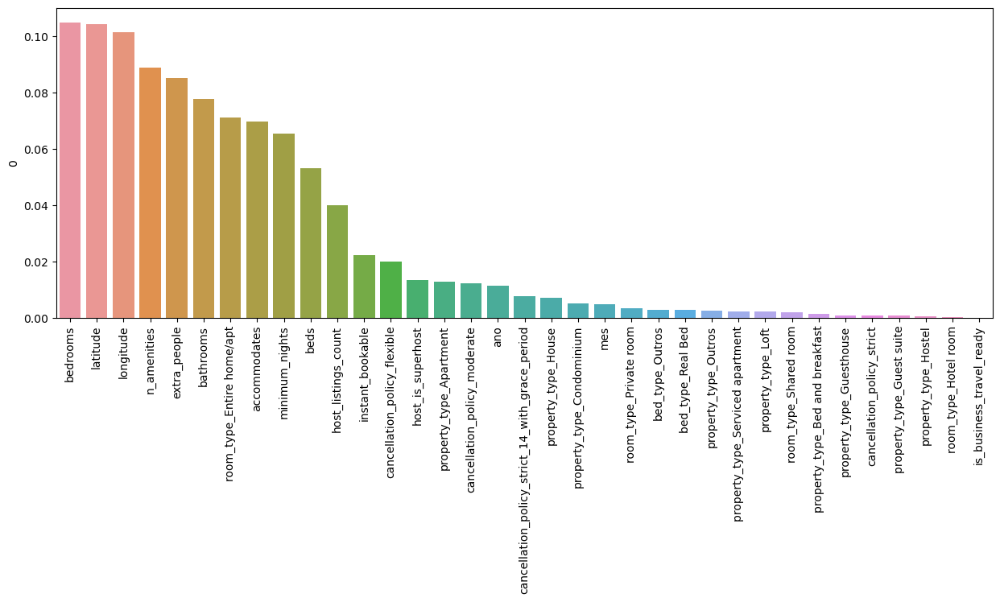

In [76]:
#print(modelo_et.feature_importances_)
#print(X_train.columns)
importancia_features = pd.DataFrame(modelo_et.feature_importances_, X_train.columns)
importancia_features = importancia_features.sort_values(by=0, ascending=False)
display(importancia_features)
plt.figure(figsize=(15, 5))
ax = sns.barplot(x=importancia_features.index, y=importancia_features[0])
ax.tick_params(axis='x', rotation=90)

### Ajustes Finais no Modelo

A variável is_business_travel_ready não apresentou impacto significativo no desempenho do modelo. Para simplificar a estrutura e reduzir possíveis fontes de ruído, optei por removê-la e realizar novos testes sem essa feature. Essa abordagem visa avaliar se sua ausência causa alguma perda relevante de performance ou se contribui para um modelo mais enxuto e eficiente.

In [77]:
base_airbnb_cod = base_airbnb_cod.drop('is_business_travel_ready', axis=1)

y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

inicio_treino = time.time()
modelo_et.fit(X_train, y_train)
fim_treino = time.time()

inicio_previsao = time.time()
previsao = modelo_et.predict(X_test)
fim_previsao = time.time()

# Calcular tempo total gasto em cada etapa
tempo_treino = fim_treino - inicio_treino
tempo_previsao = fim_previsao - inicio_previsao

print(avaliar_modelo('ExtraTrees', y_test, previsao, tempo_treino, tempo_previsao))

Modelo ExtraTrees:
R²:97.51%
RSME:41.88
Tempo de treino: 402.06 segundos
Tempo de previsão: 12.22 segundos


In [78]:
base_teste = base_airbnb_cod.copy()
for coluna in base_teste:
    if 'bed_type' in coluna:    
        base_teste = base_teste.drop(coluna, axis=1)
print(base_teste.columns)
y = base_teste['price']
X = base_teste.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

inicio_treino = time.time()
modelo_et.fit(X_train, y_train)
fim_treino = time.time()

inicio_previsao = time.time()
previsao = modelo_et.predict(X_test)
fim_previsao = time.time()

# Calcular tempo total gasto em cada etapa
tempo_treino = fim_treino - inicio_treino
tempo_previsao = fim_previsao - inicio_previsao
print(avaliar_modelo('ExtraTrees', y_test, previsao, tempo_treino, tempo_previsao))

Index(['host_is_superhost', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price',
       'extra_people', 'minimum_nights', 'instant_bookable', 'ano', 'mes',
       'n_amenities', 'property_type_Apartment',
       'property_type_Bed and breakfast', 'property_type_Condominium',
       'property_type_Guest suite', 'property_type_Guesthouse',
       'property_type_Hostel', 'property_type_House', 'property_type_Loft',
       'property_type_Outros', 'property_type_Serviced apartment',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room',
       'cancellation_policy_flexible', 'cancellation_policy_moderate',
       'cancellation_policy_strict',
       'cancellation_policy_strict_14_with_grace_period'],
      dtype='object')
Modelo ExtraTrees:
R²:97.49%
RSME:42.05
Tempo de treino: 353.98 segundos
Tempo de previsão: 12.21 segundos


# Deploy do Projeto

- Passo 1 -> Criar arquivo do Modelo (joblib)<br>
- Passo 2 -> Escolher a forma de deploy:
    - Arquivo Executável + Tkinter
    - Deploy em Microsite (Flask)
    - Deploy apenas para uso direto Streamlit
- Passo 3 -> Outro arquivo Python (pode ser Jupyter ou PyCharm)
- Passo 4 -> Importar streamlit e criar código
- Passo 5 -> Atribuir ao botão o carregamento do modelo
- Passo 6 -> Deploy feito

In [79]:
#Salva a base de dados tratada como backup
X['price'] = y
X.to_csv('dados.csv')

In [80]:
import joblib
joblib.dump(modelo_et, 'modelo.joblib')

['modelo.joblib']